In [24]:
import pandas as pd
import os
import yaml
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from scipy.stats import ecdf, mannwhitneyu
from statsmodels.stats.weightstats import ttest_ind
import seaborn as sns
import matplotlib.colors as mcolors

from utils import *

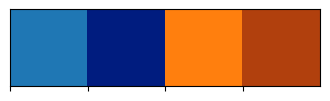

In [25]:
# Get the first two colors from the default Seaborn color palette
base_colors = sns.color_palette("tab10", 2)  # Blue and Orange

# Create the darker versions
darker_colors = sns.color_palette("dark", 2)  # Blue and Orange

# Combine into a single palette
custom_palette = [base_colors[0], darker_colors[0], base_colors[1], darker_colors[1]]

# Optional: set it as the current Seaborn palette
sns.set_palette(custom_palette)

# Preview
import matplotlib.pyplot as plt
sns.palplot(custom_palette)
plt.show()

In [26]:
config = yaml.safe_load(open('/Users/ursic/PhD/Projects/1_DataAnalysis_zebrafish/beads_in_zebrafish/magnetic_tweezers_SD/config_noco.yml'))

filepath_measurements_info = config['filepath_measurements_info']
dir_plots = os.path.join(config['dir_parent'], '3_plots')  # Folder for saving plots
dir_analysis = os.path.join(config['dir_parent'], '2_analysis')  # Folder for saving analysis results
recalculate = config['recalculate']  # Whether to recalculate measurements if they already exist
pix_size = config['pix_size'] 
dt = config['dt']  # Time step in seconds

force_ranges = config['force_ranges']  # Force ranges for averaging curves
force_range = force_ranges[0]

subtract_backgroung = config['subtract_background']  # Whether to subtract background from displacement

creep_only = False
if config['fit_type'] == 'creep jeff':
    creep_only = True  # If the fit type is 'creep jeff', we only plot creep curves
    
creep_only_label = '_only_creep' if creep_only else ''

displacement_column = 'CORRECTED DISPLACEMENT [um]' if subtract_backgroung else 'DISPLACEMENT [um]'  # Use the original displacement, not corrected
subtr_bck_label = 'subtr_bck' if subtract_backgroung else 'no_subtr_bck'

In [27]:
df_results_perturb = pd.read_csv(dir_plots + f'/results/results_material_properties_{subtr_bck_label}.csv')

In [28]:
df_results_perturb = df_results_perturb.sort_values(by='MT_STATUS', ascending=False)

print(df_results_perturb.columns)

Index(['Unnamed: 0', 'file', 'EXPERIMENT', 'EMBRYO', 'TRACK_ID',
       'PULSE_NUMBER', 'MT_STATUS', 'AVG_FORCE', 'k', 'eta_1', 'eta_2',
       'k_err', 'eta_1_err', 'eta_2_err', 't_1', 'R_SQUARED_smooth',
       'R_SQUARED_fit', 'rising_dif', 'relaxing_dif', 'rising_dif_norm',
       'rising_dif_norm_inverse', 'relative_dif', 'tau_r', 'a',
       'elastic_viscous_ratio'],
      dtype='object')


# General overview

In [29]:
N_tracks = len(df_results_perturb)
print(f'We have in total {N_tracks} tracks. ')
# N_relaxed_too_much = len(df_results_perturb[df_results_perturb['relax_too_much'] == True])
# N_not_differentiable = len(df_results_perturb[df_results_perturb['fit_divisible'] == False])


# print(f'Out of those, we have {N_relaxed_too_much} tracks that relaxed to a value below zero. We do not take those into account.')
# print(f'Furthermore, we have {N_not_differentiable} tracks that are not differentiable. We do not take those into account either.\n')

# N_R_low = len(df_results_perturb[df_results_perturb['R_SQUARED'] < 0.8])
# print(f'Number of fits with R^2 < 0.5: {N_R_low}')

We have in total 447 tracks. 


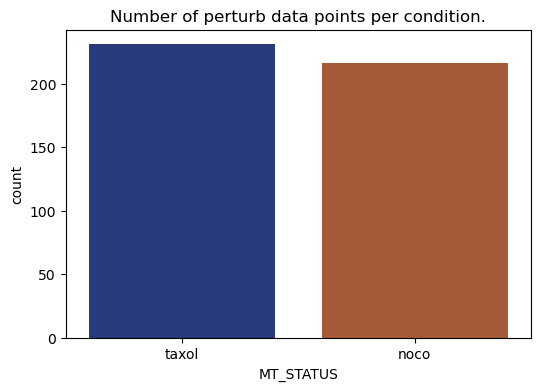

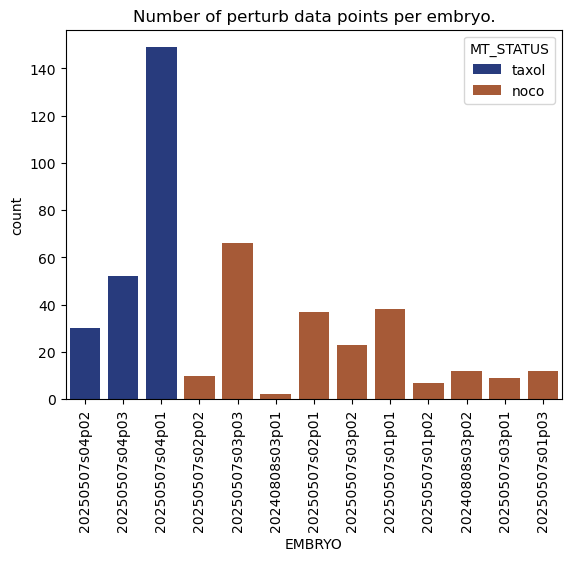

In [30]:
fig = plt.figure(figsize=(6, 4))
# Second subplot: Summary statistics

sns.countplot(data=df_results_perturb, x='MT_STATUS', hue='MT_STATUS', alpha=0.9, palette=darker_colors)
plt.title(f'Number of perturb data points per condition.')
plt.show()

sns.countplot(data=df_results_perturb, x='EMBRYO', hue='MT_STATUS', alpha=0.9, palette=darker_colors)
plt.title(f'Number of perturb data points per embryo.')
plt.xticks(rotation=90)
plt.show()

In [31]:
# comparissons = ['fit_divisible', 'relax_too_much', 'R_SQUARED', 'R_SQUARED_KV']

# boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)
# for comp in comparissons:
#     fig = plt.figure(figsize=(6, 4))
#     # Second subplot: Summary statistics
#     sns.countplot(data=df_results_perturb[df_results_perturb[comp]>0.5], x='MT_STATUS', hue='MT_STATUS', alpha=0.9, palette=darker_colors)
#     plt.title(f'{comp}')

In [32]:
# r_sq_min = 0.5
# print(f'Number of successful fits with Jeffreys model: ',  sum(df_results_perturb['R_SQUARED']>r_sq_min))
# # print(f'Number of successful fits with Kelvin Voigt model: ', sum(df_results_perturb['R_SQUARED_KV']>r_sq_min))
# print(f'Number of better fits with KV model instead of Jeffreys: ', sum(df_results_perturb['R_SQUARED_KV']>df_results_perturb['R_SQUARED']))

# print('KV fits better in M-phase: ', len(df_results_perturb[(df_results_perturb['MT_STATUS'] == 'noco')&(df_results_perturb['R_SQUARED_KV']>df_results_perturb['R_SQUARED'])&((df_results_perturb['R_SQUARED_KV']>r_sq_min))]))
# print('KV fits better in interphase: ', len(df_results_perturb[(df_results_perturb['MT_STATUS'] == 'taxol')&(df_results_perturb['R_SQUARED_KV']>df_results_perturb['R_SQUARED'])&((df_results_perturb['R_SQUARED_KV']>r_sq_min))]))

In [33]:
# filter out the unreasonable tracks, based on the filter conditions (in the utils.py file)
t_on, t_off = 10, 30
df_results_filtered = filter_based_on_recovery(df_results_perturb, ['taxol', 'noco']).sort_values(by='MT_STATUS', ascending=False)

print(f'We are left with {len(df_results_filtered)} tracks after filtering.\n')

print(f'Percentage of usable tracks for nocodazole: {len(df_results_filtered[df_results_filtered["MT_STATUS"] == "noco"])/len(df_results_perturb[df_results_perturb["MT_STATUS"] == "noco"])*100:.2f}%')
print(f'Percentage of usable tracks for taxol: {len(df_results_filtered[df_results_filtered["MT_STATUS"] == "taxol"])/len(df_results_perturb[df_results_perturb["MT_STATUS"] == "taxol"])*100:.2f}%')

taxol [-0.43078725  3.80822258]
noco [0.00519421 0.97229487]
We are left with 401 tracks after filtering.

Percentage of usable tracks for nocodazole: 89.81%
Percentage of usable tracks for taxol: 89.61%


# The data that is still left after filtering 

We removed:
- the data with poor fits (R^2 lower than 0.5)
- the fits with very high errors for parameters
- the data that relaxes below 0 (this indicates some reorganization of the cytoplasm beyond the responce to the magnetic pulse)
- the data with practically non-differentiable fits (those would be "good" fits but not compatible with our physical model of the cytoplasm)


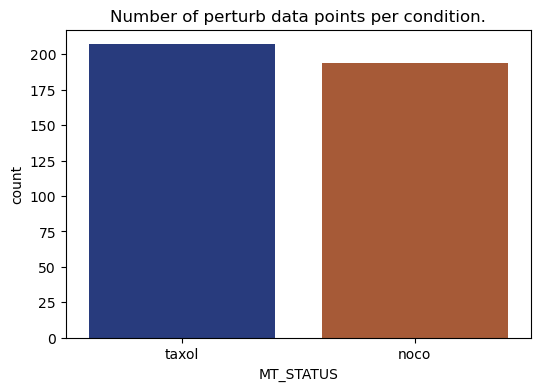

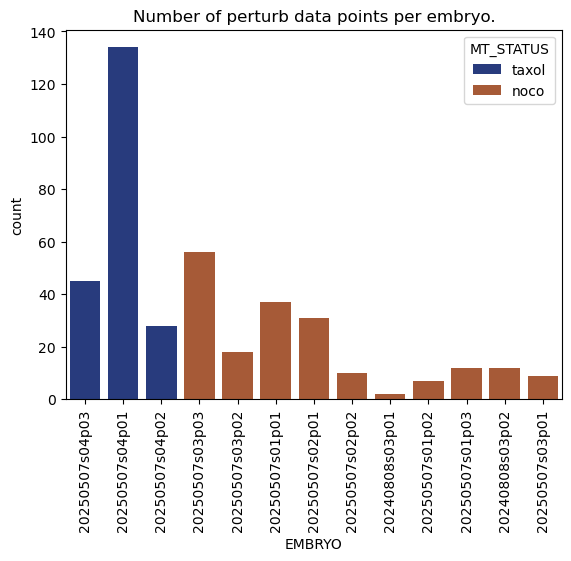

In [34]:
fig = plt.figure(figsize=(6, 4))
# Second subplot: Summary statistics

sns.countplot(data=df_results_filtered, x='MT_STATUS', hue='MT_STATUS', alpha=0.9, palette=darker_colors)
plt.title(f'Number of perturb data points per condition.')
plt.show()

sns.countplot(data=df_results_filtered, x='EMBRYO', hue='MT_STATUS', alpha=0.9, palette=darker_colors)
plt.title(f'Number of perturb data points per embryo.')
plt.xticks(rotation=90)
plt.show()

# perturb data groupped together

In [35]:
# All the parameters that we are interested in with their labels for plots:

params = ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'rising_dif', 'rising_dif_norm', 'relative_dif', 'a', 'tau_r']

labels = ['$\\kappa$ (pN/$\\mathrm{\\mu m}$)', '$\\gamma_1$ (pN s/$\\mathrm{\\mu m}$)', '$\\gamma_2$ (pN s/$\\mathrm{\\mu m}$)', 'Ratio between elastic and viscous deformation', 'Displacement ($\\mathrm{\\mu m}$)', 'Displacement / Force ($\\mathrm{\\mu m}$/ pN)', 'a = Relaxation / Displacement ', 'a', '$\\tau_R$']

mapping = {'noco': 'Nocodazole', 'taxol': 'Taxol'}

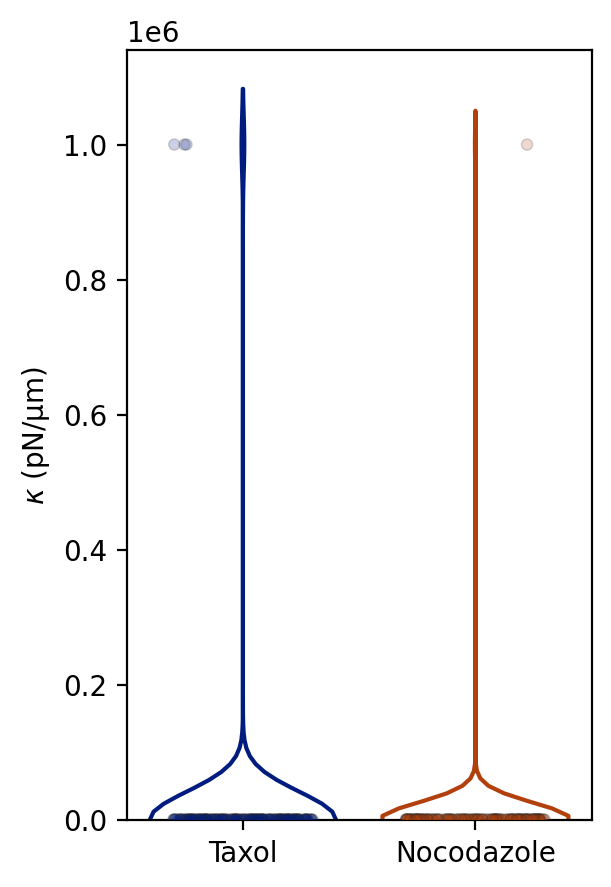

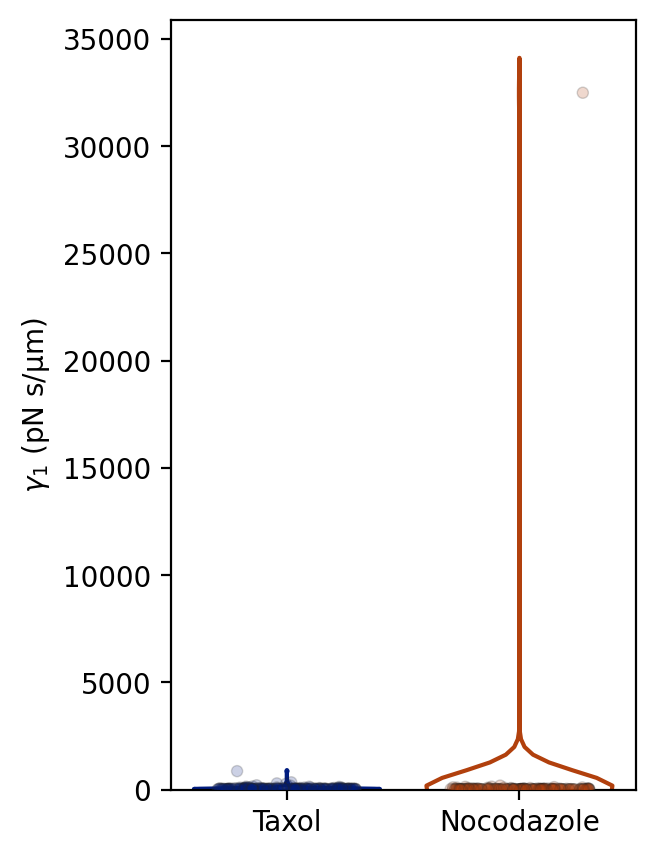

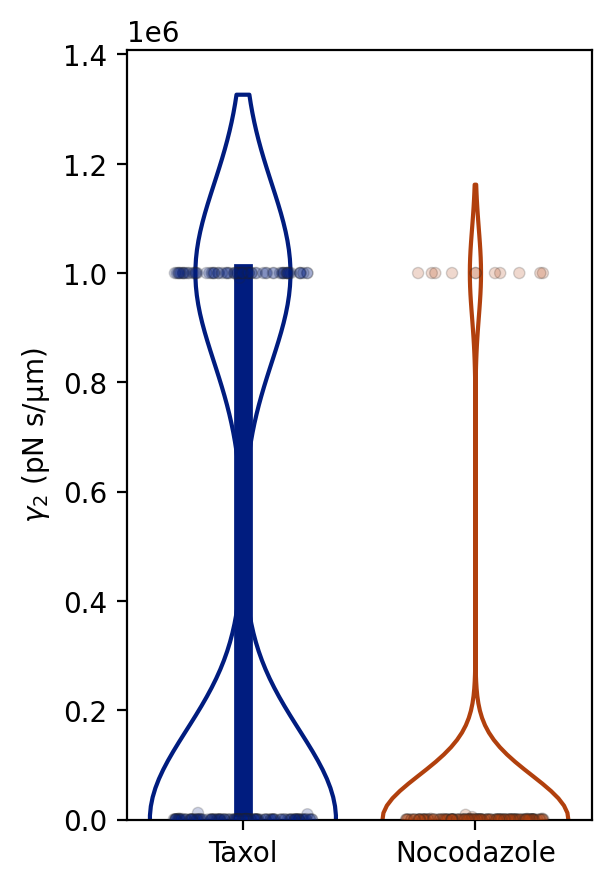

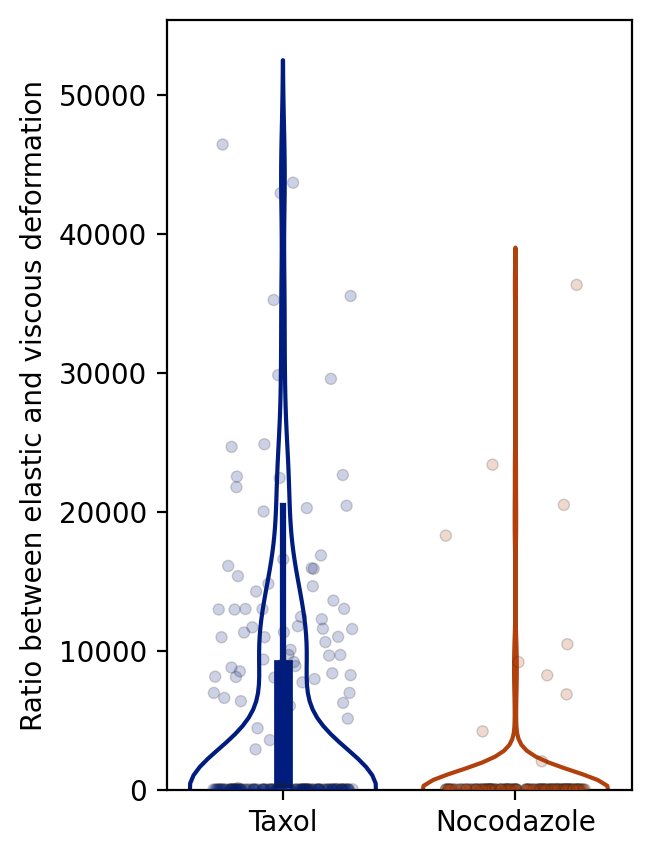

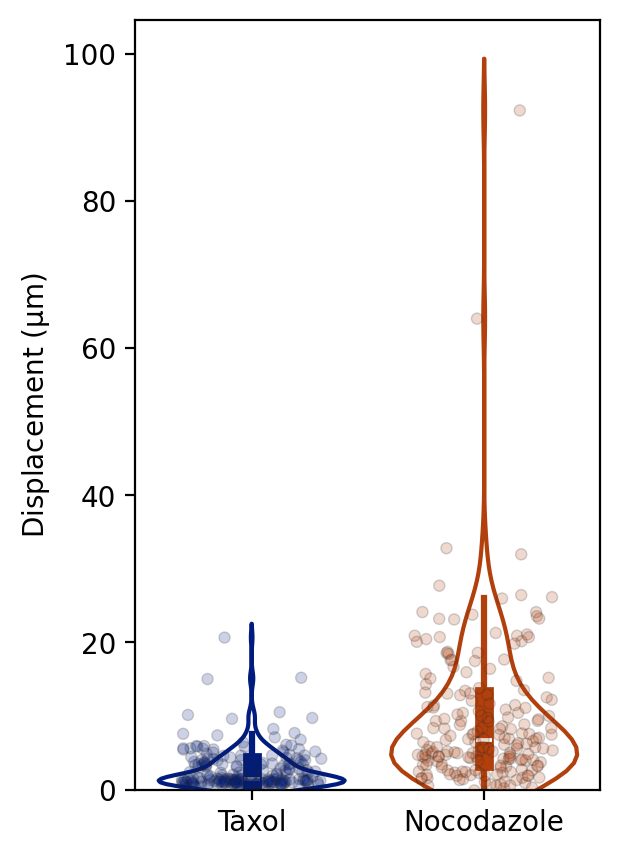

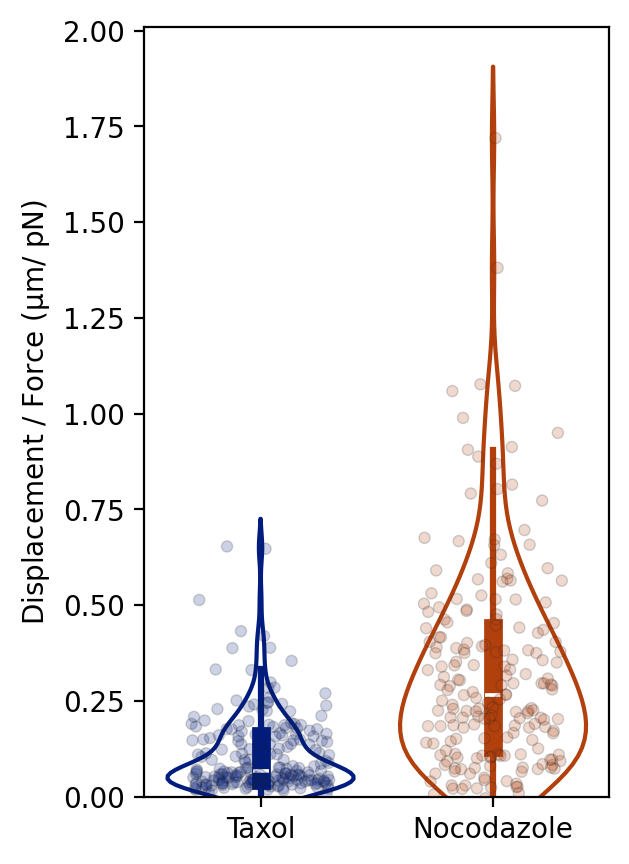

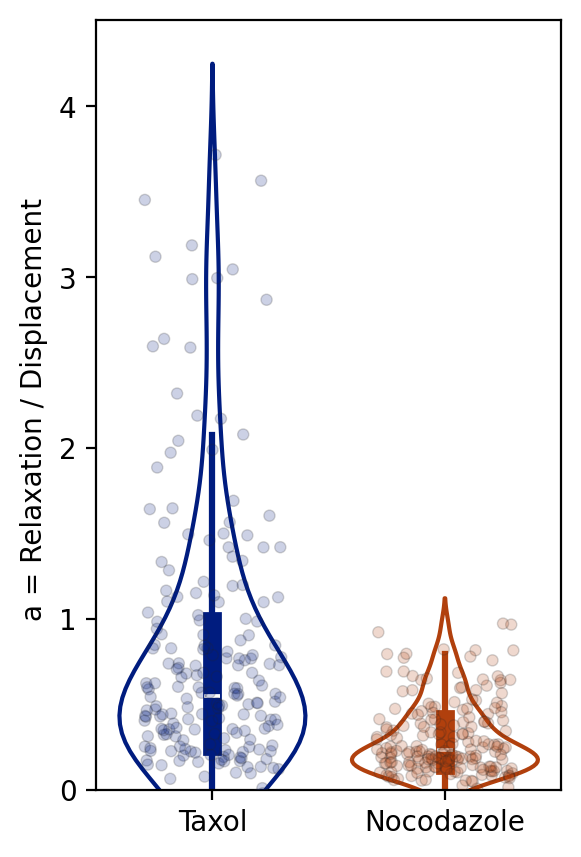

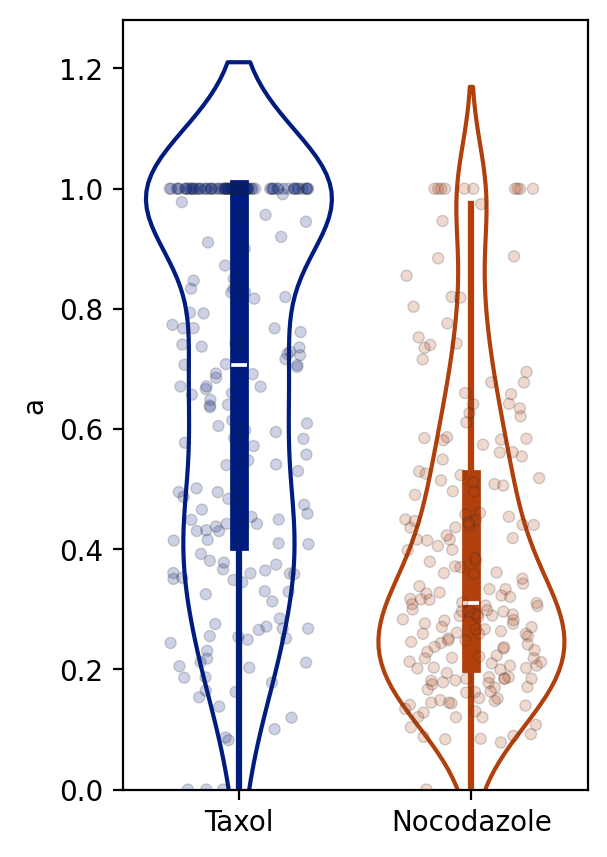

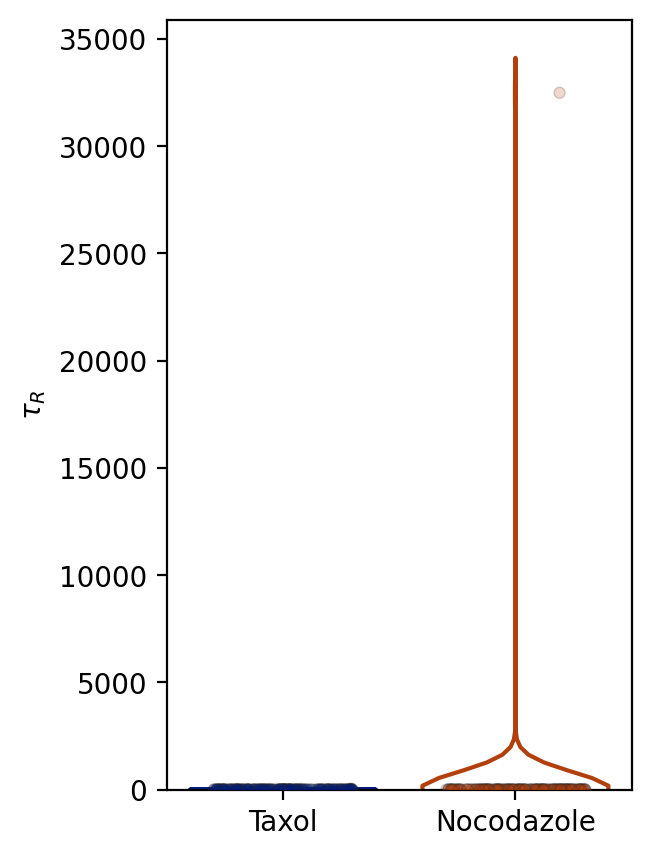

In [36]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)
for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(3, 5), dpi=200)
    # sns.boxplot(x='MT_STATUS', y=param, data=df_results_filtered, boxprops=boxprops, fliersize=0)
    sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_filtered, jitter=0.3, alpha=0.2, linewidth=0.5, legend=False, size=4, palette=darker_colors)
    sns.violinplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_filtered, fill=False, palette=darker_colors)
    plt.ylabel(label)
    plt.xlabel('')
    plt.xticks(ticks = ['taxol', 'noco'], labels=['Taxol', 'Nocodazole'])
    plt.ylim(bottom=0)
    # plt.yscale('log')
    plt.show()


# Clustered data

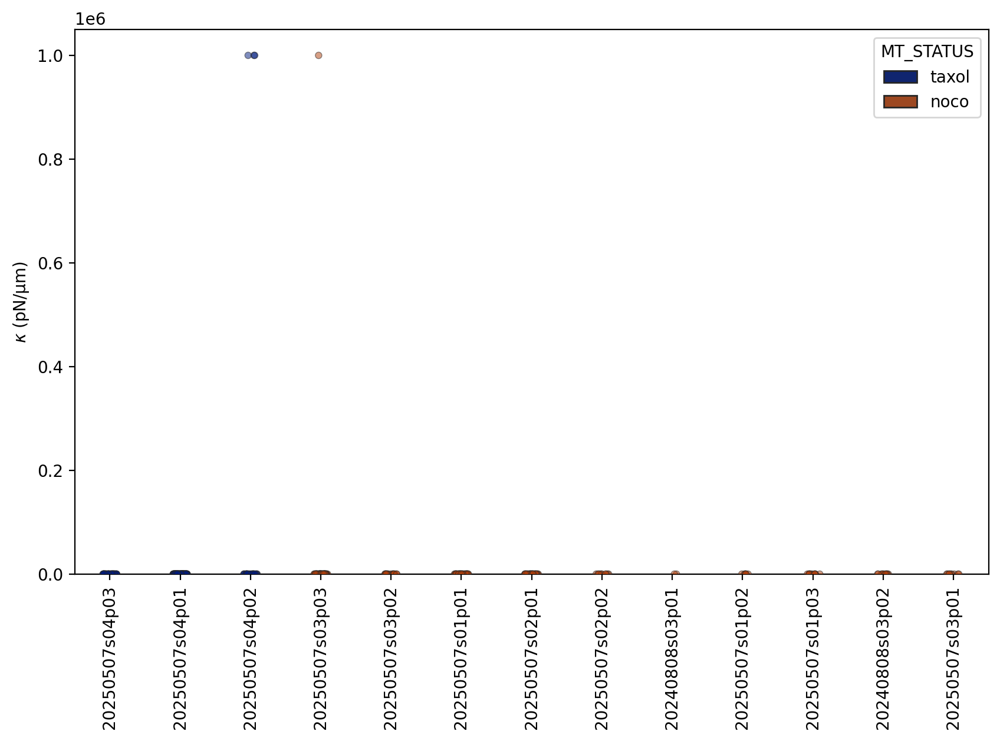

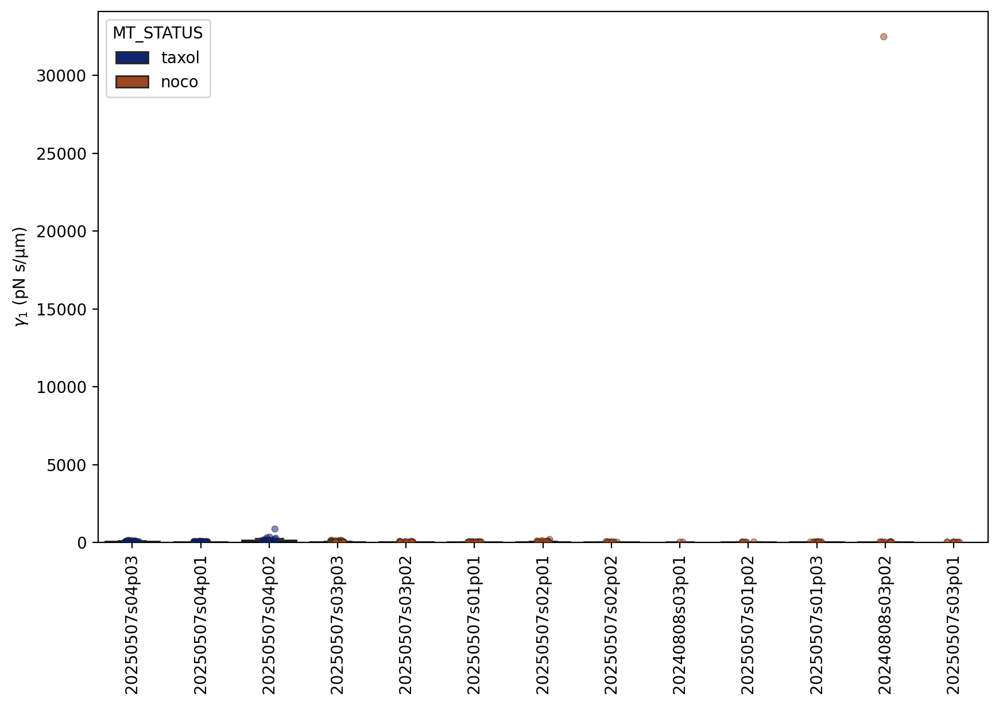

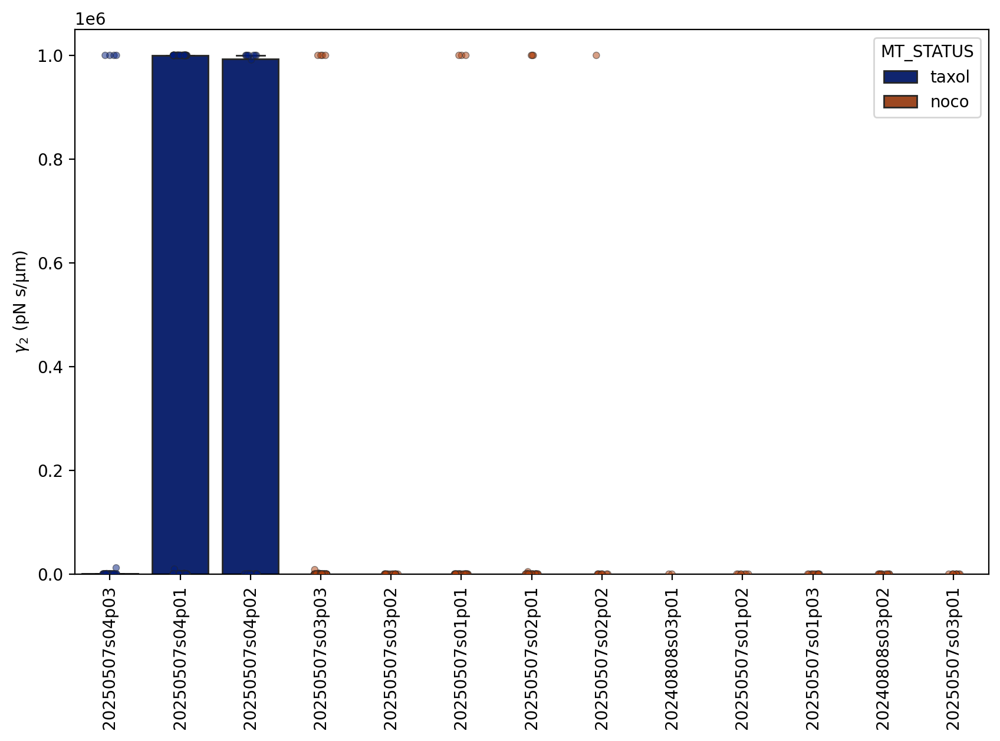

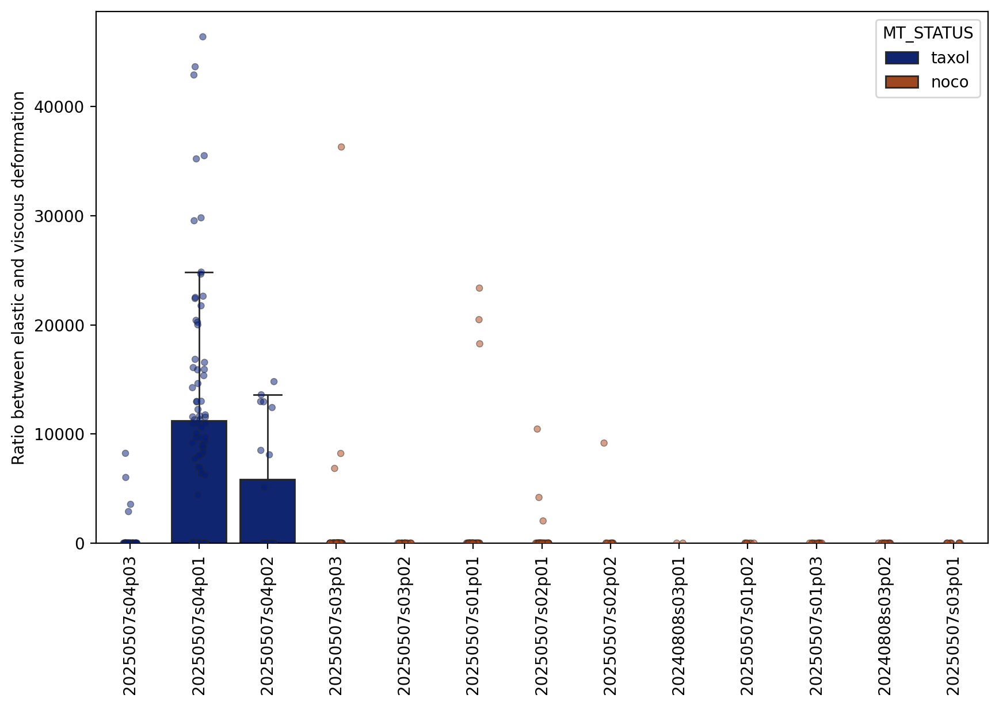

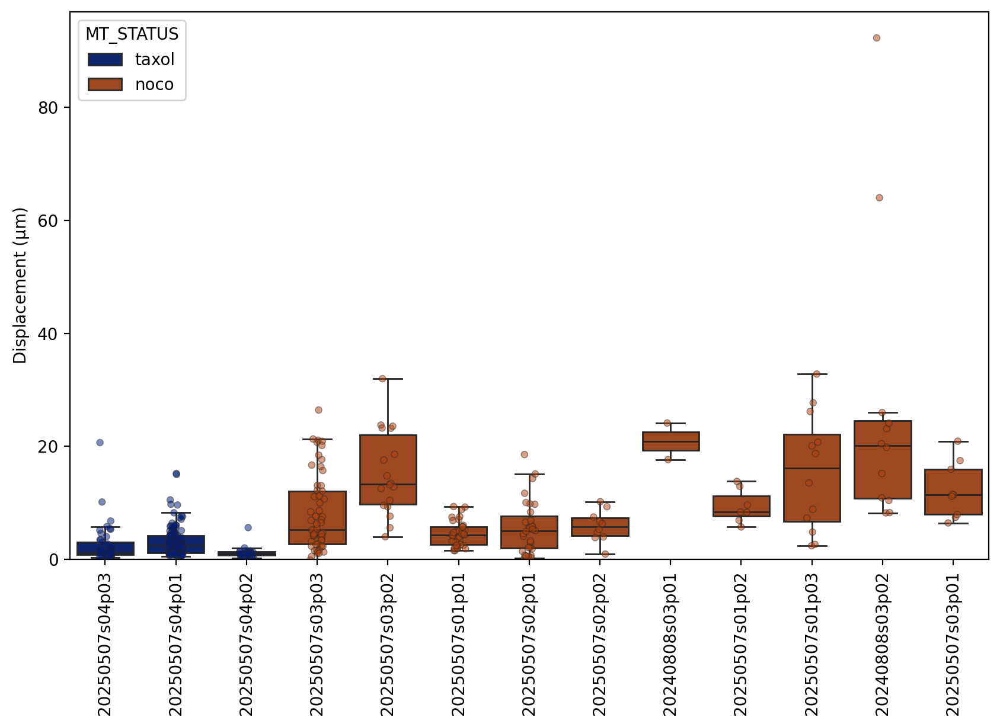

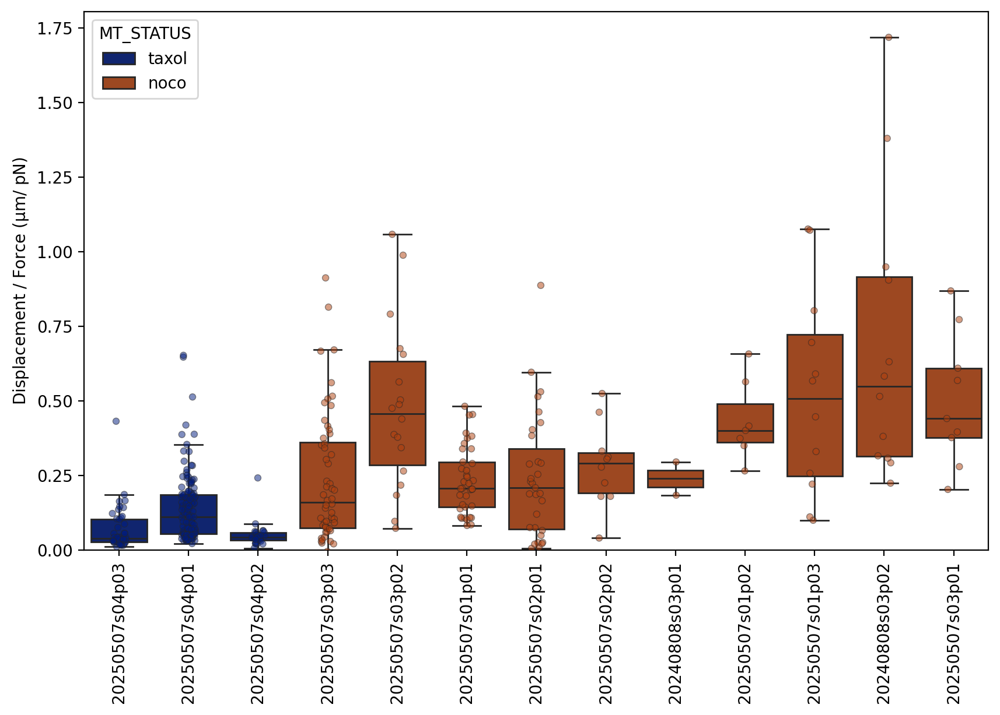

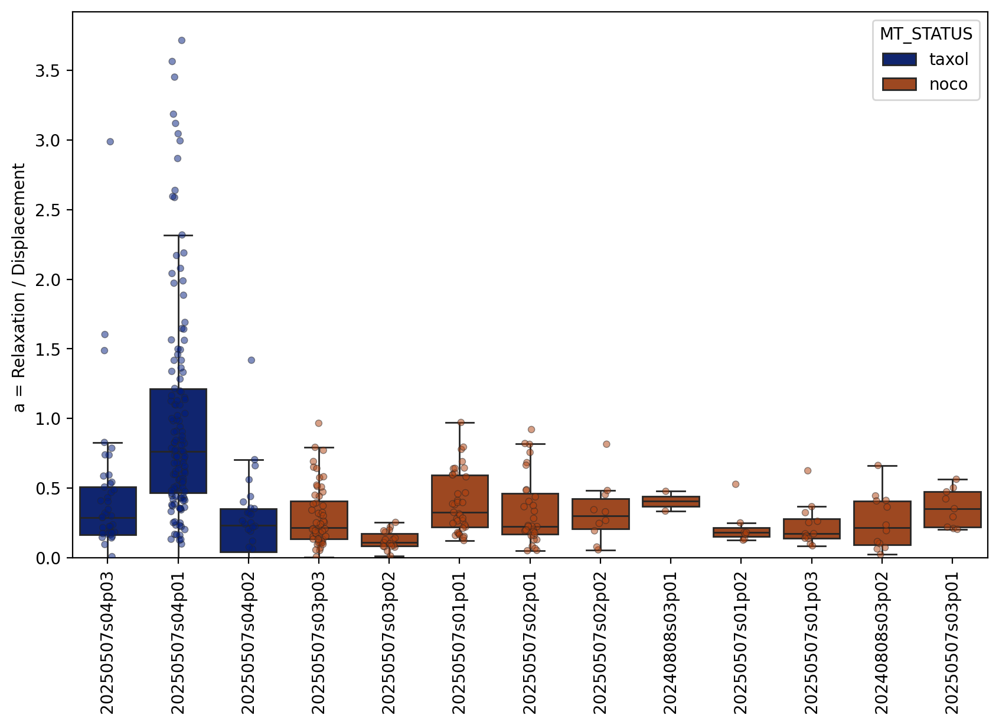

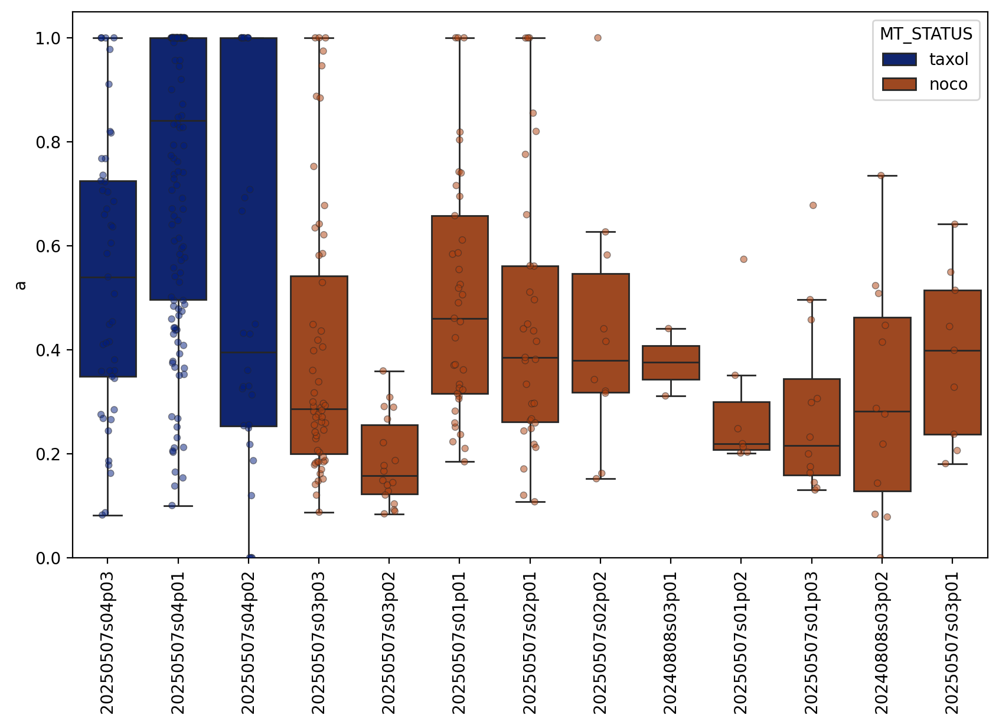

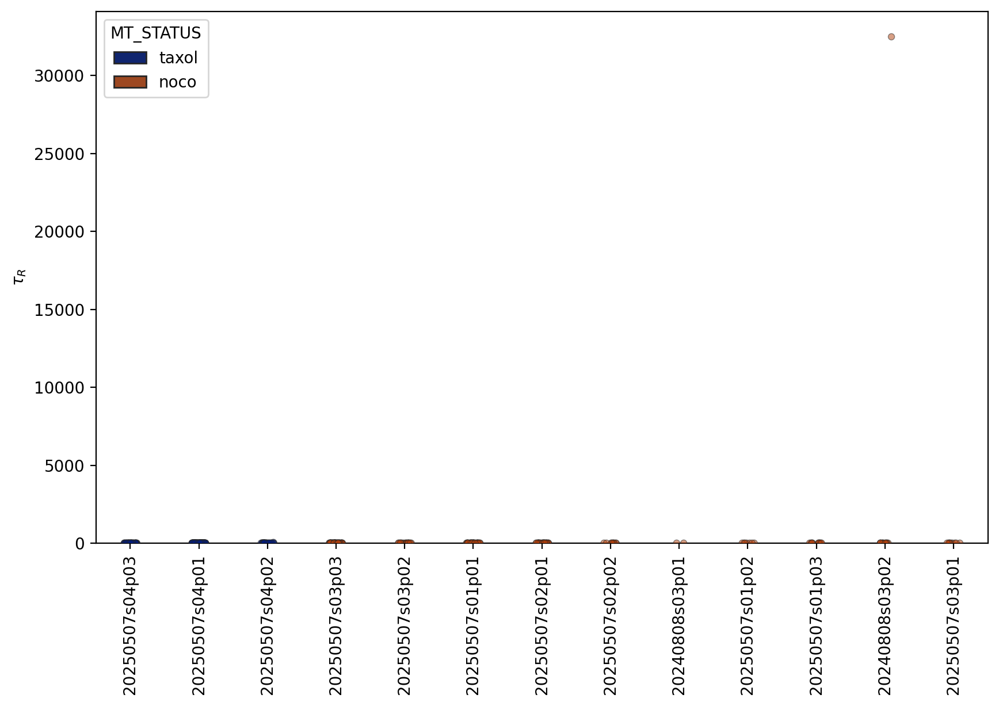

In [37]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    sns.boxplot(x='EMBRYO', y=param, hue='MT_STATUS', data=df_results_filtered, fliersize=0, palette=darker_colors)
    sns.stripplot(x='EMBRYO', y=param, hue='MT_STATUS', data=df_results_filtered, dodge=False, jitter=True, alpha=0.5, linewidth=0.5, legend=False, size=4, palette=darker_colors)
    plt.xlabel('')
    plt.ylabel(label)
    plt.ylim(bottom=0)
    plt.xticks(rotation=90)
    plt.show()

# Binned by the pulse number

There seems to be no significant trend in the measurements from repetitive pulses. Although, there is a slight change from teh first pulse to the rest. 

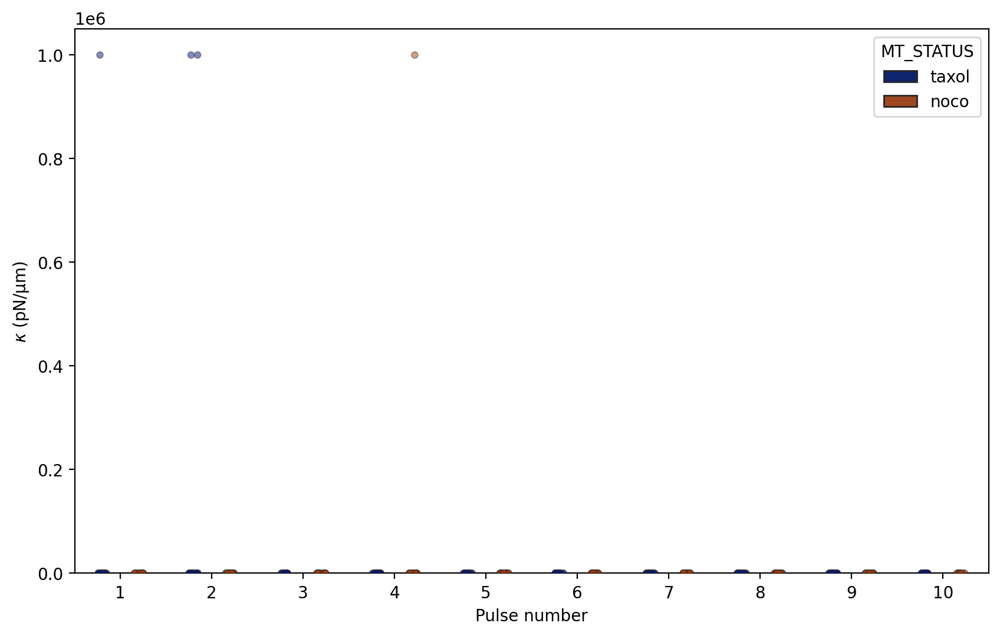

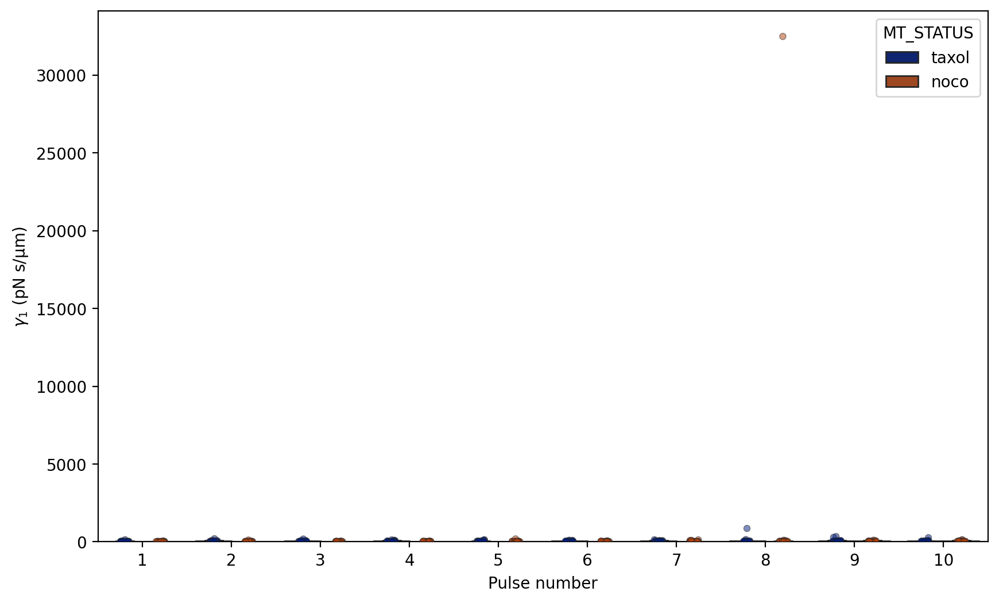

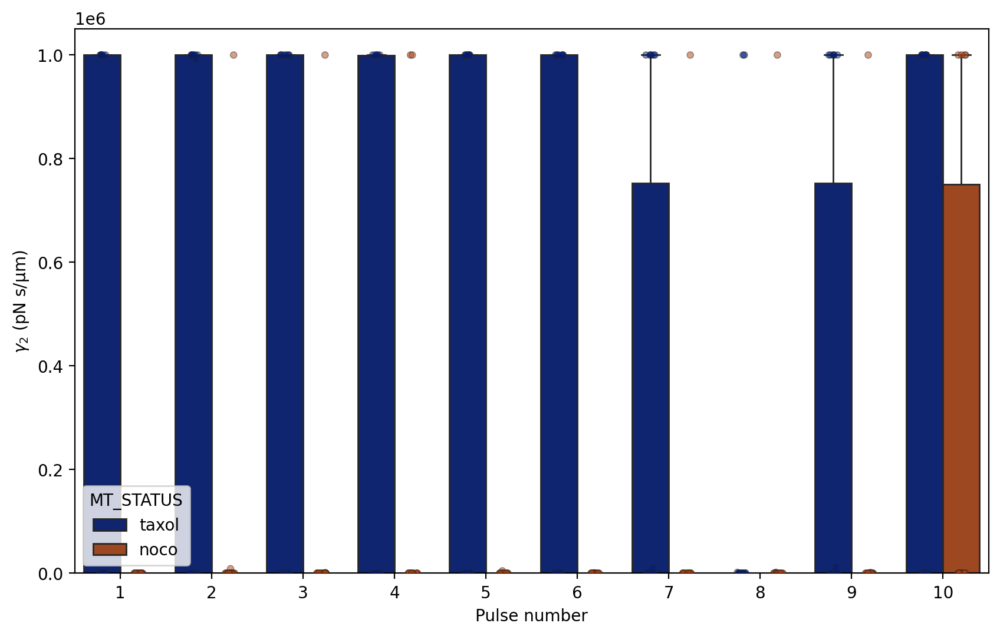

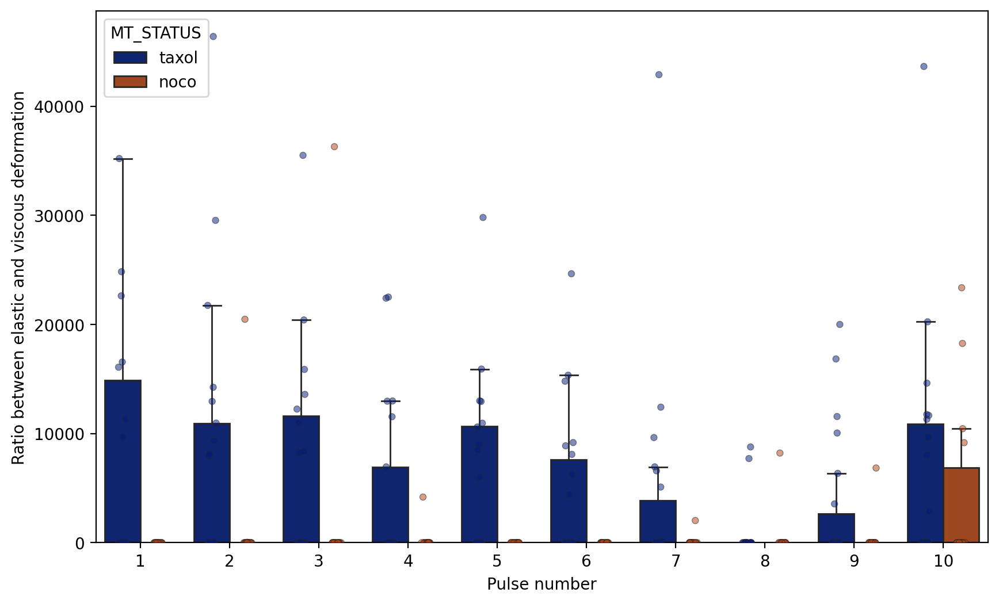

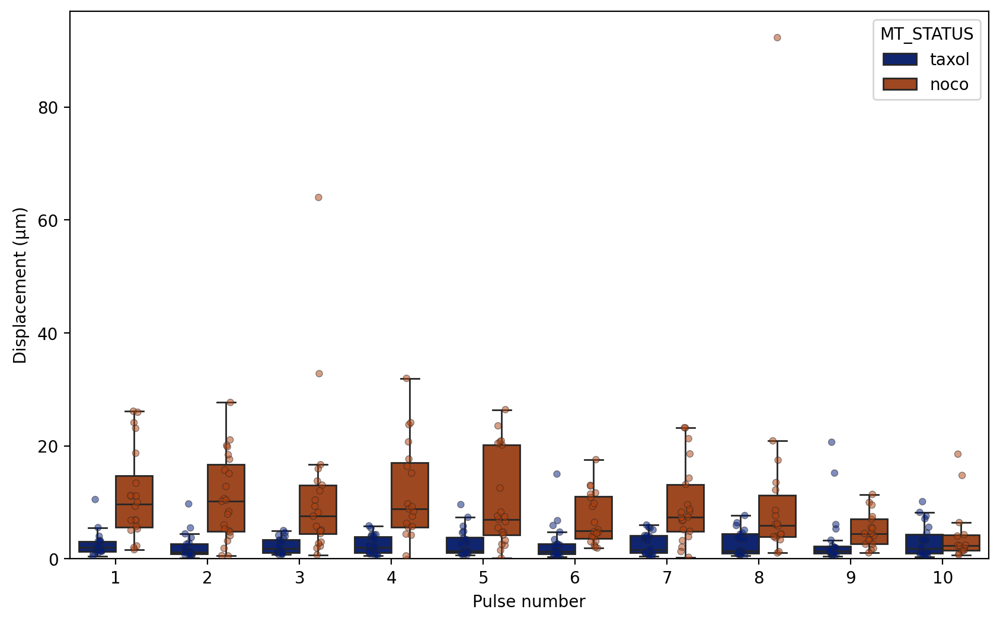

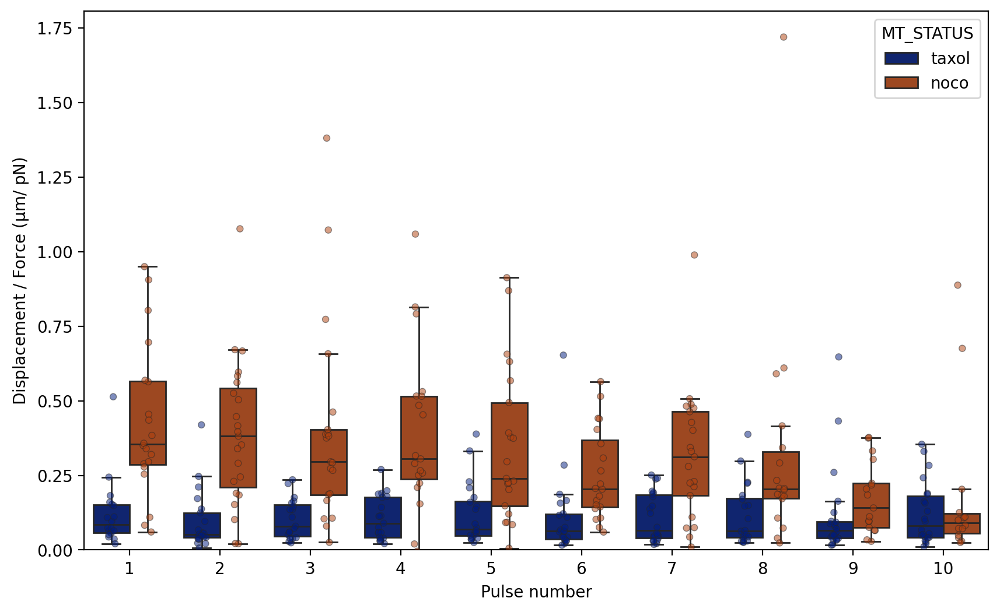

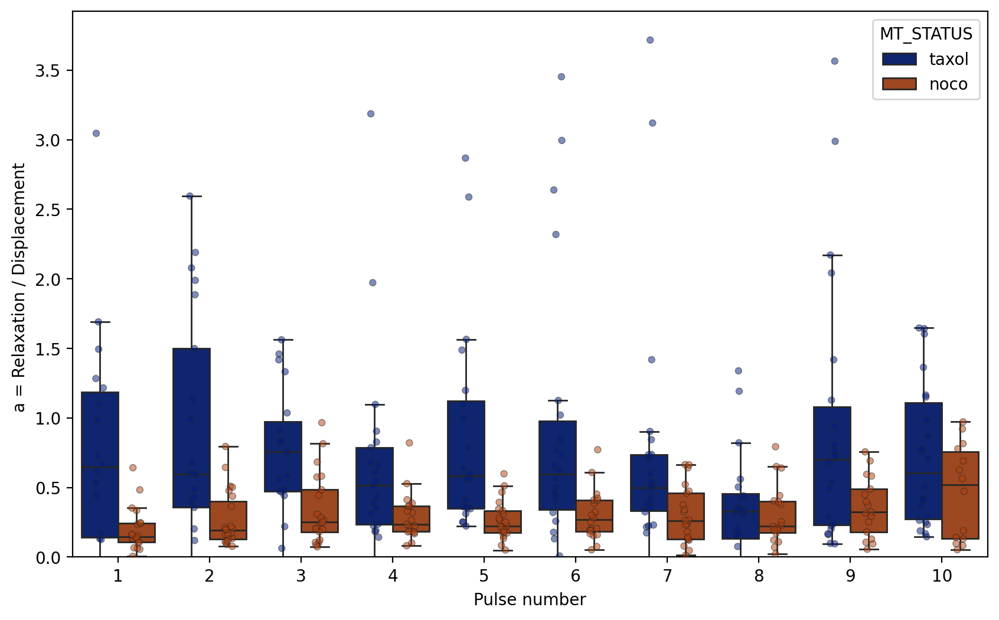

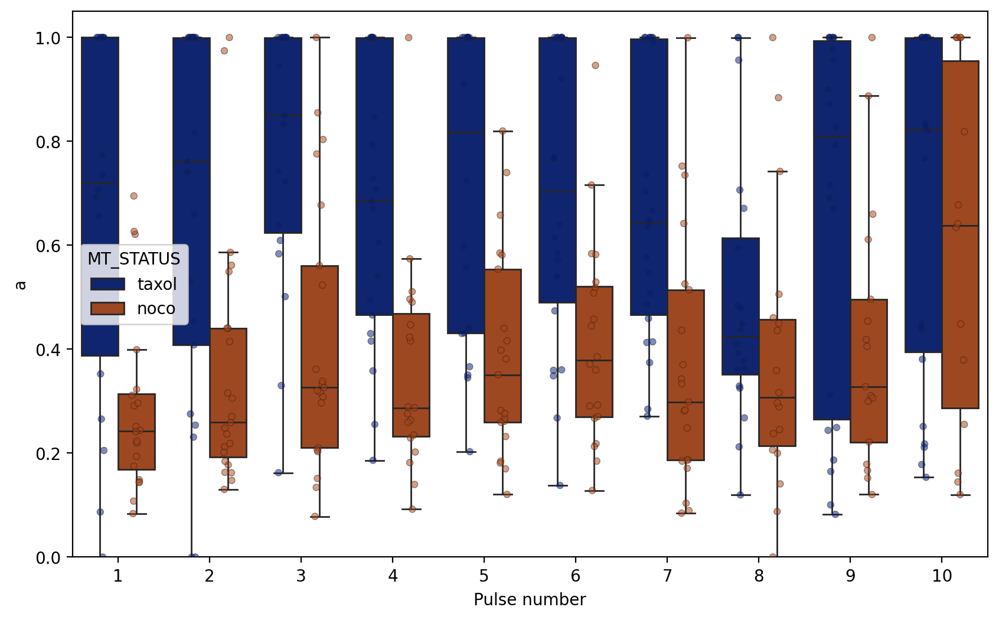

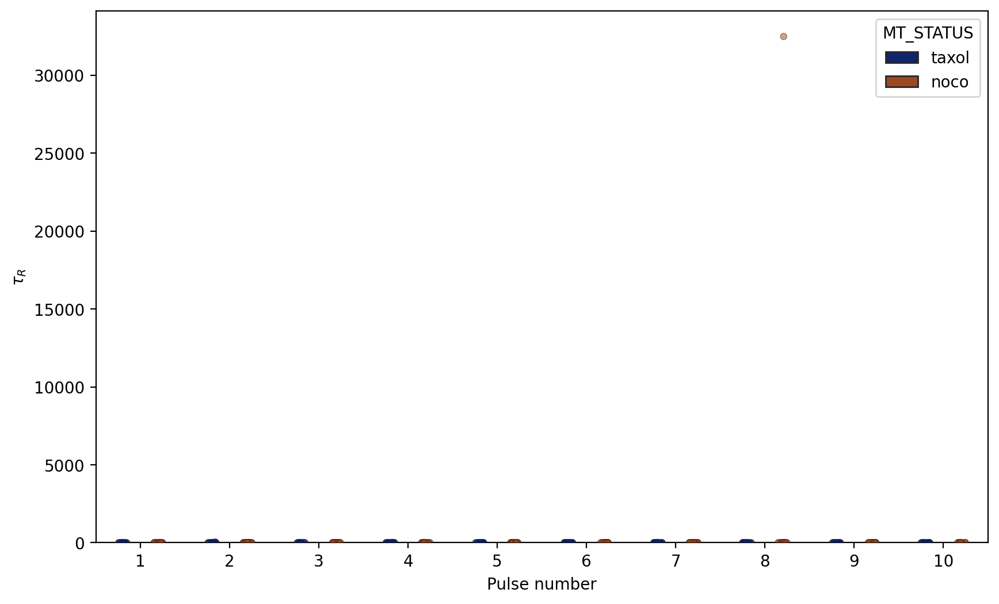

In [38]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)
for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    sns.boxplot(x='PULSE_NUMBER', y=param, hue='MT_STATUS', data=df_results_filtered, fliersize=0, palette=darker_colors)
    sns.stripplot(x='PULSE_NUMBER', y=param, hue='MT_STATUS', data=df_results_filtered, dodge=True, jitter=True, alpha=0.5, linewidth=0.5, legend=False, size=4, palette=darker_colors)
    plt.xlabel('Pulse number')
    plt.ylabel(label)
    plt.ylim(bottom=0)

    plt.show()

# Binned by force

## Data together with rolling average

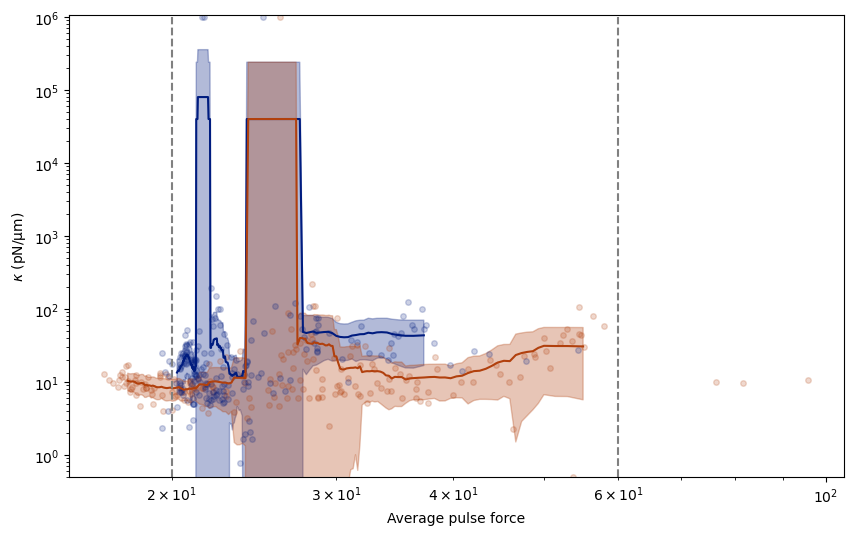

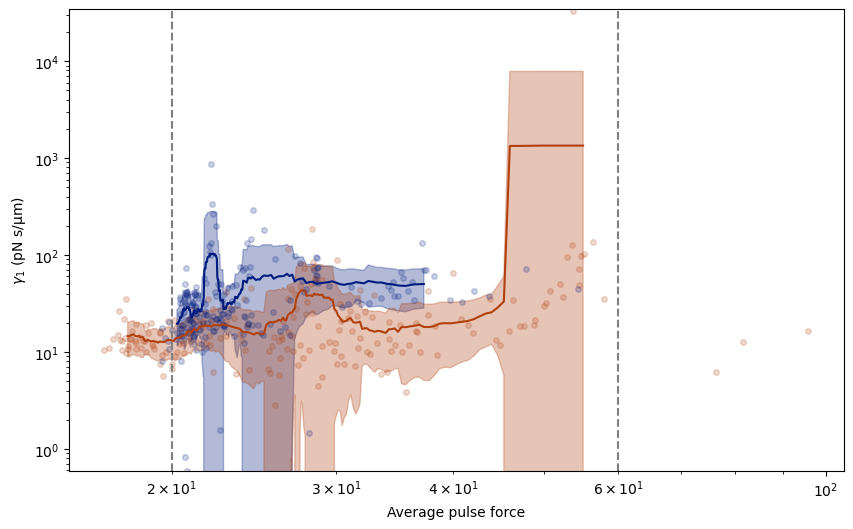

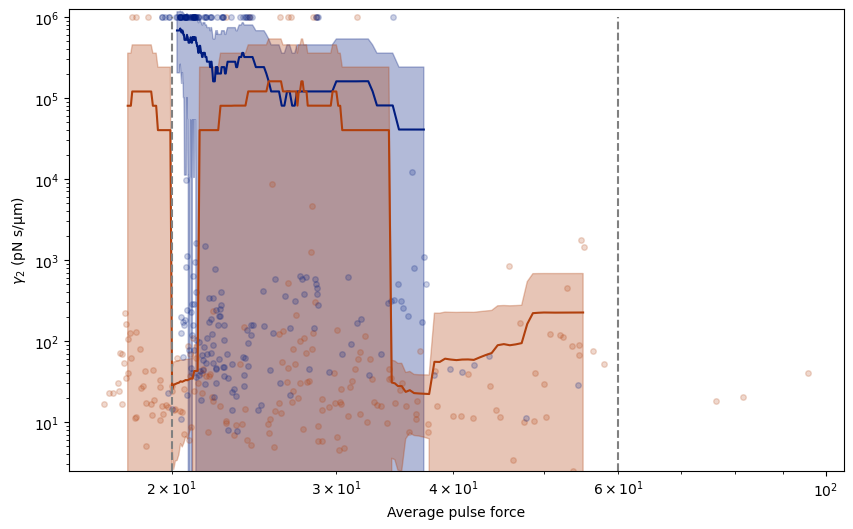

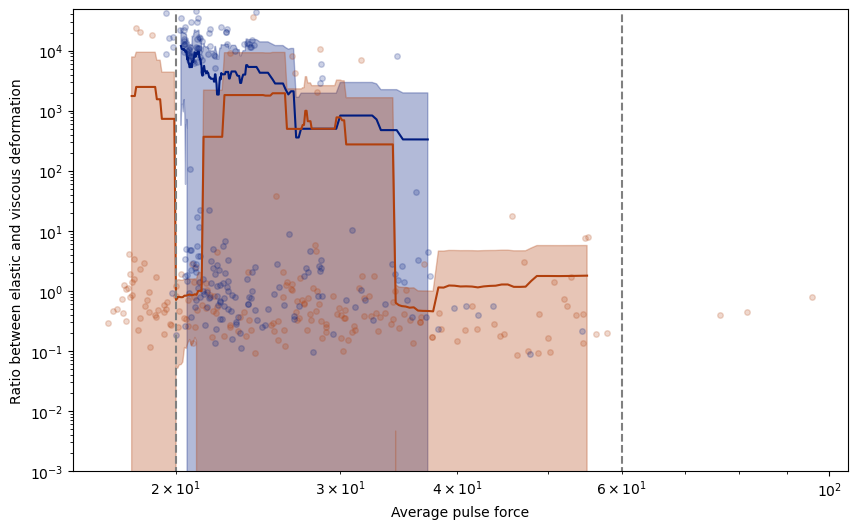

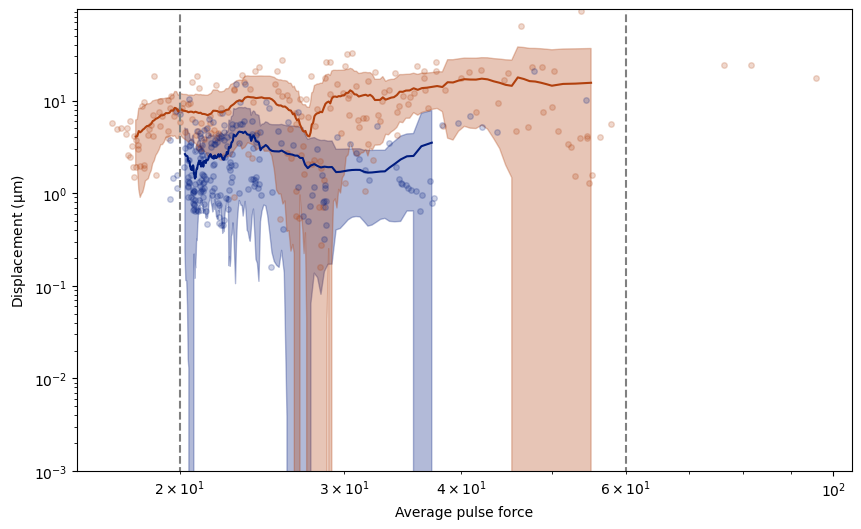

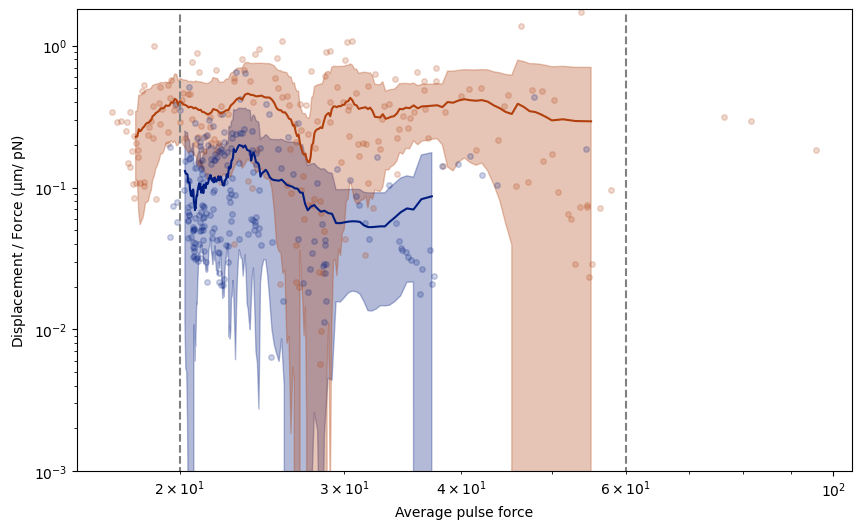

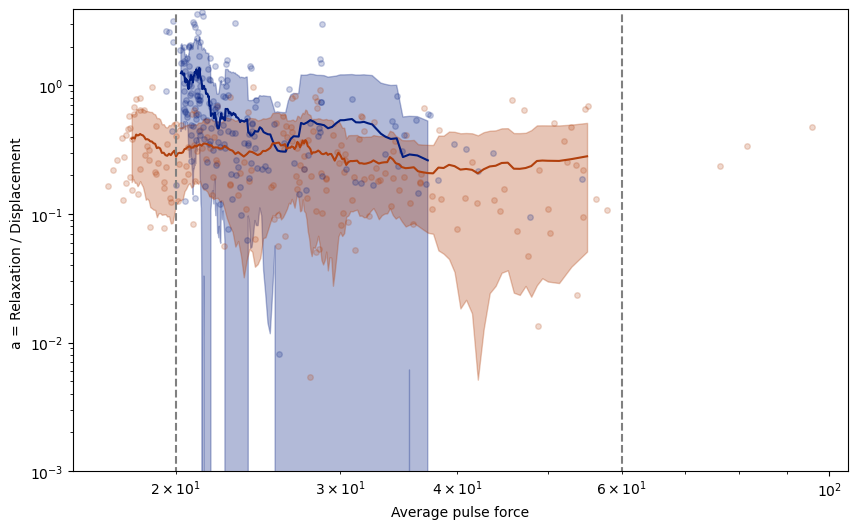

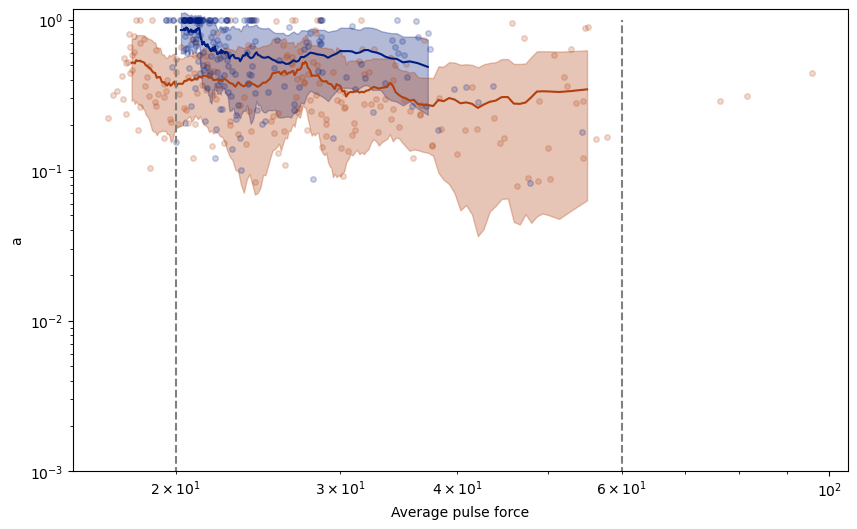

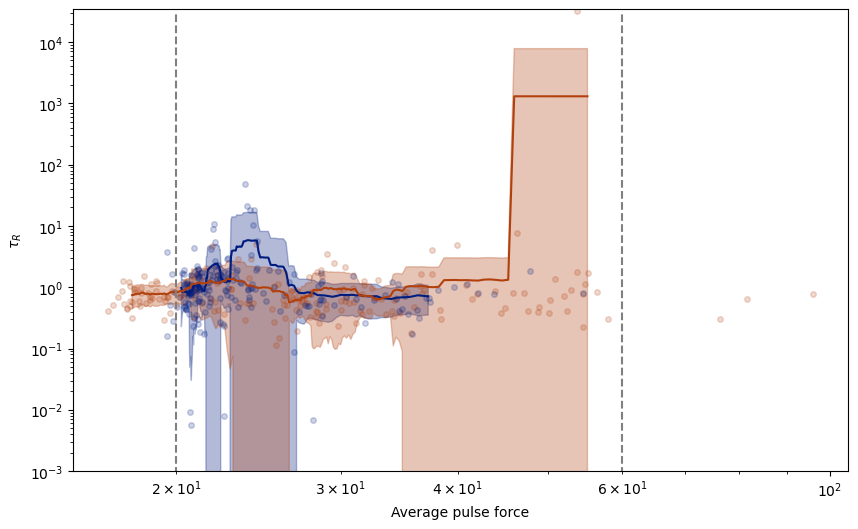

In [39]:
df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6))
    # plot perturb data
    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', 'AVG_FORCE'], df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param], 'o', color=sns.color_palette()[3], alpha=0.2, markersize = 4)
    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', 'AVG_FORCE'], df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param], 'o', color=sns.color_palette()[1], alpha=0.2, markersize = 4)
    
    window = 25
    # plot the roling average
    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', 'AVG_FORCE'].rolling(window=window, center=True).mean(), df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param].rolling(window=window, center=True).mean(), '-', color=sns.color_palette()[1], alpha=1)

    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', 'AVG_FORCE'].rolling(window=window, center=True).mean(), df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param].rolling(window=window , center=True).mean(), '-', color=sns.color_palette()[3], alpha=1)

    # plot the standard deviation
    plt.fill_between(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', 'AVG_FORCE'].rolling(window=window, center=True).mean(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param].rolling(window=window, center=True).mean()- df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param].rolling(window=window, center=True).std(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param].rolling(window=window, center=True).mean()+ df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param].rolling(window=window, center=True).std(),
    color=sns.color_palette()[1], alpha=0.3)

    plt.fill_between(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', 'AVG_FORCE'].rolling(window=window, center=True).mean(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param].rolling(window=window, center=True).mean()- df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param].rolling(window=window, center=True).std(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param].rolling(window=window, center=True).mean()+ df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param].rolling(window=window, center=True).std(),
    color=sns.color_palette()[3], alpha=0.3)

    plt.vlines(x=force_ranges, ymin=df_results_filtered[param].min(), ymax=df_results_filtered[param].max(), color='gray', linestyle='--', label='Force range')


    plt.xlabel('Average pulse force')
    plt.ylabel(label)
    plt.ylim(bottom=max(df_results_filtered[param].min(), 0.001))
    # plt.xlim(left=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

## Bootstrapping the data

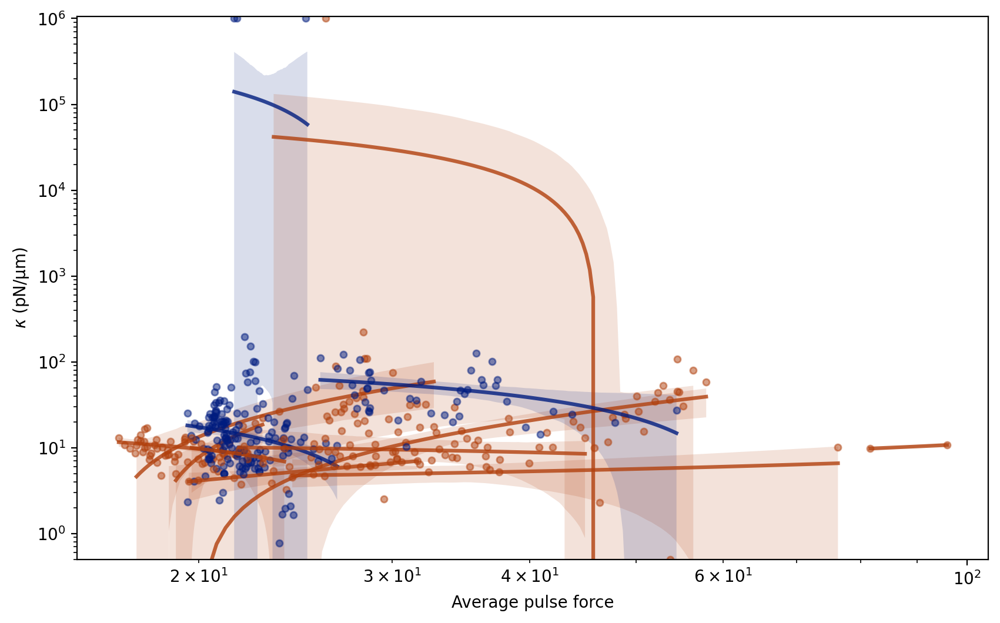

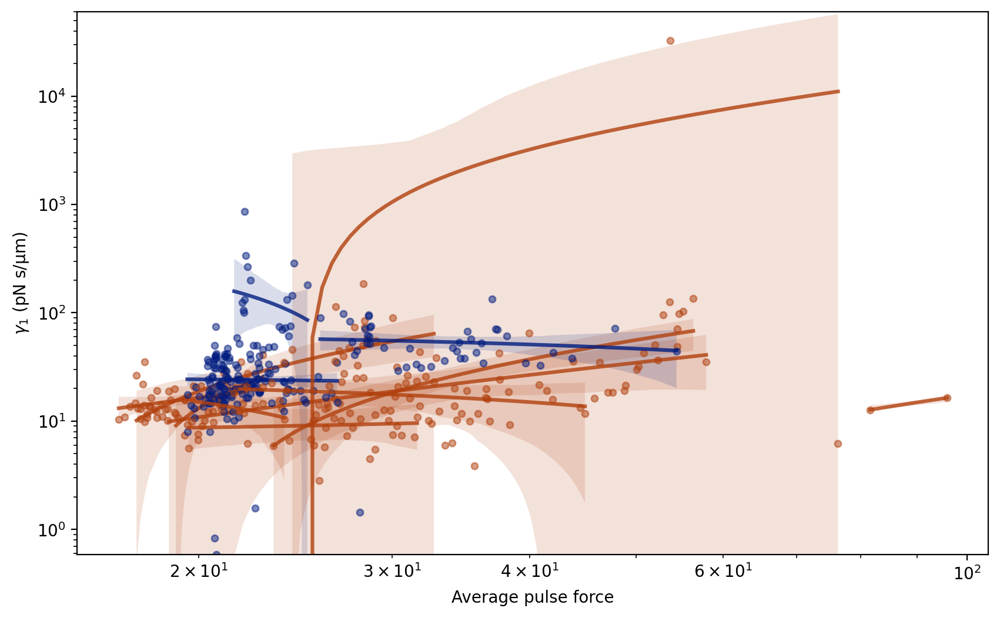

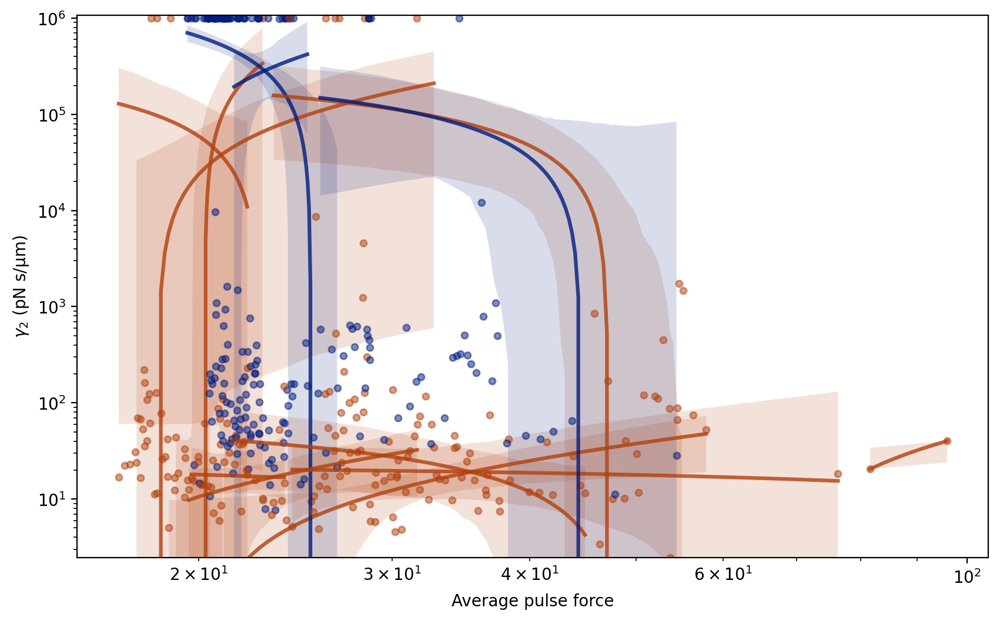

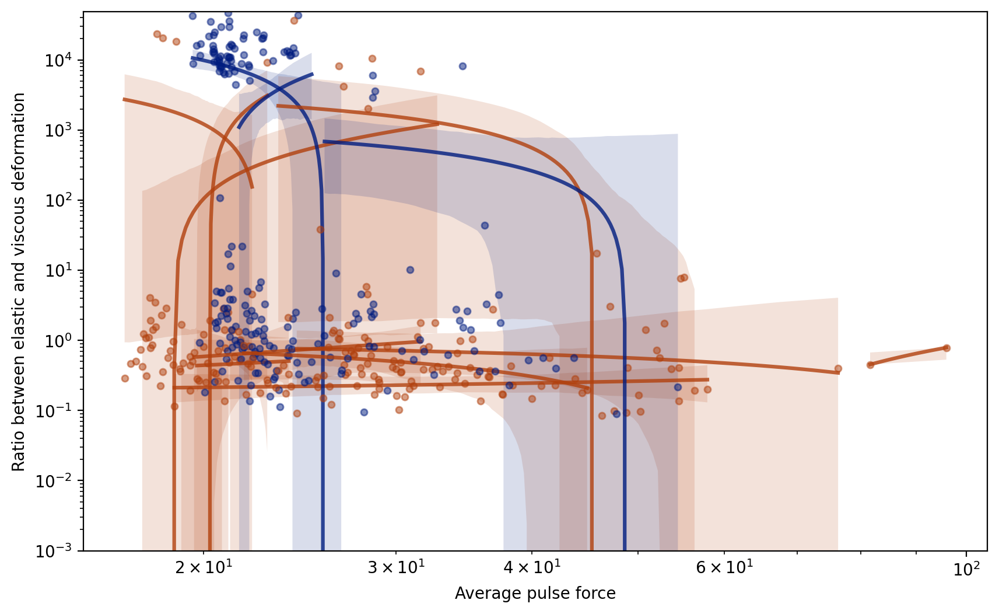

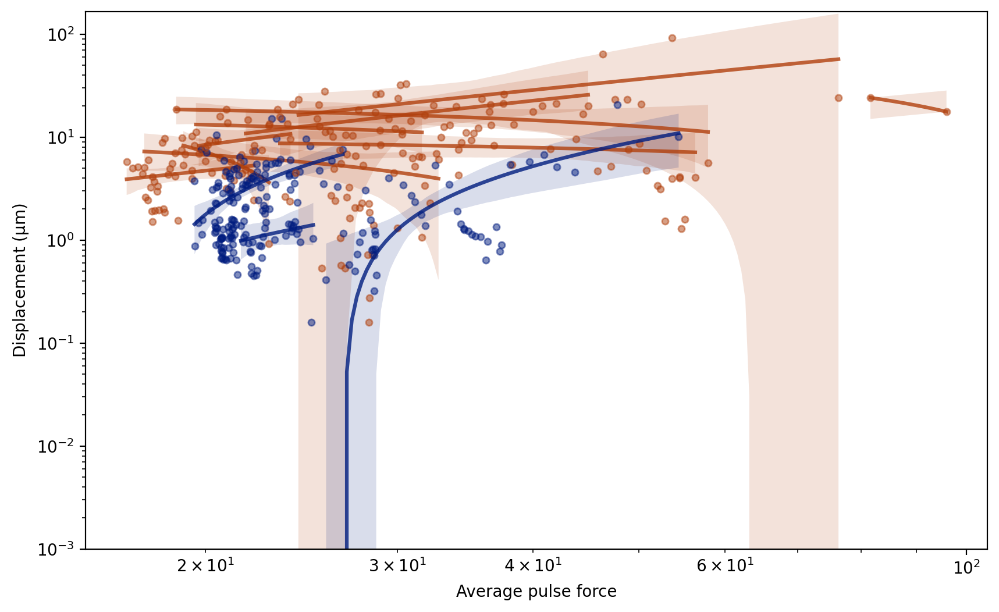

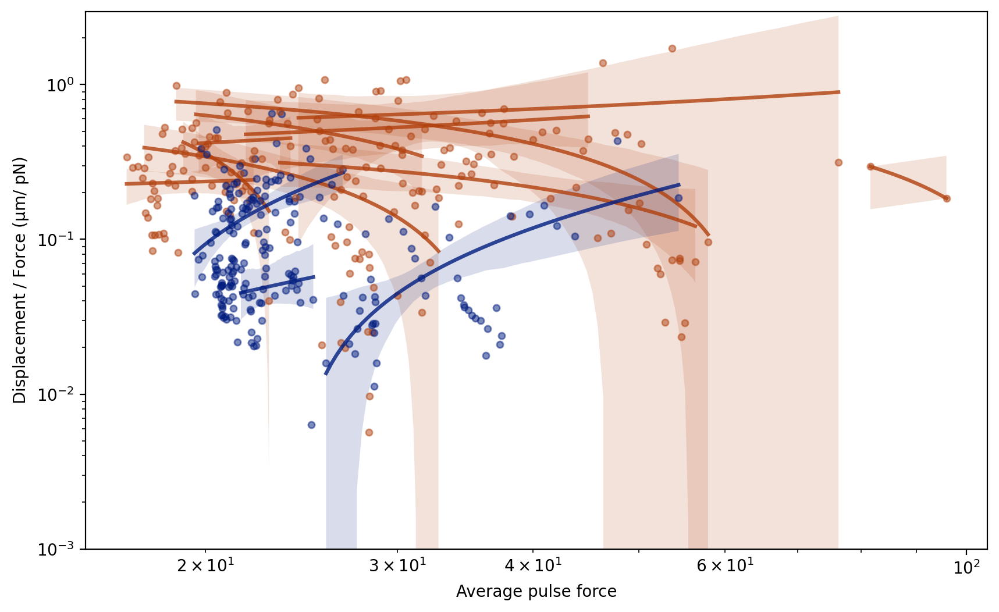

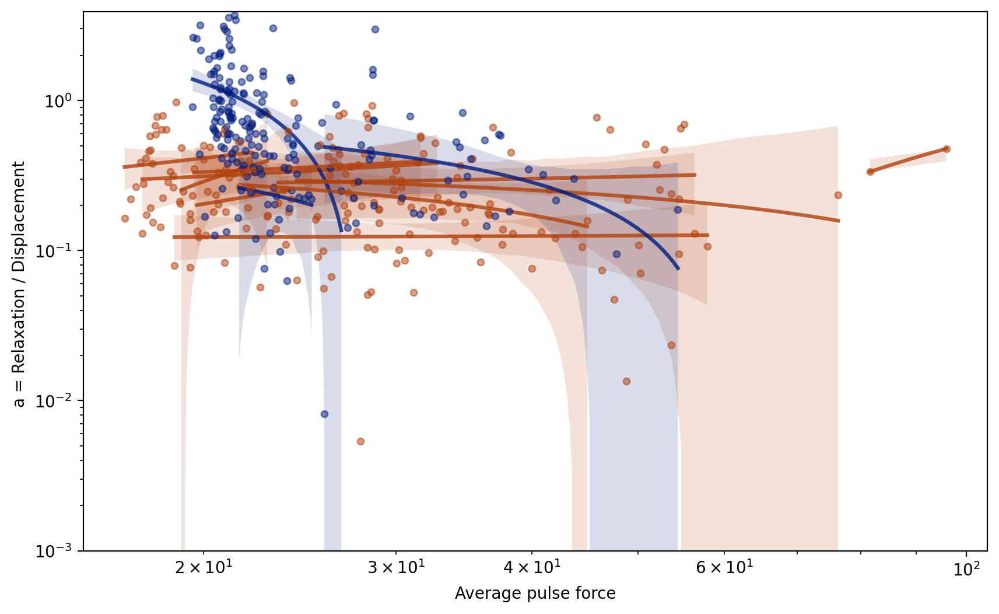

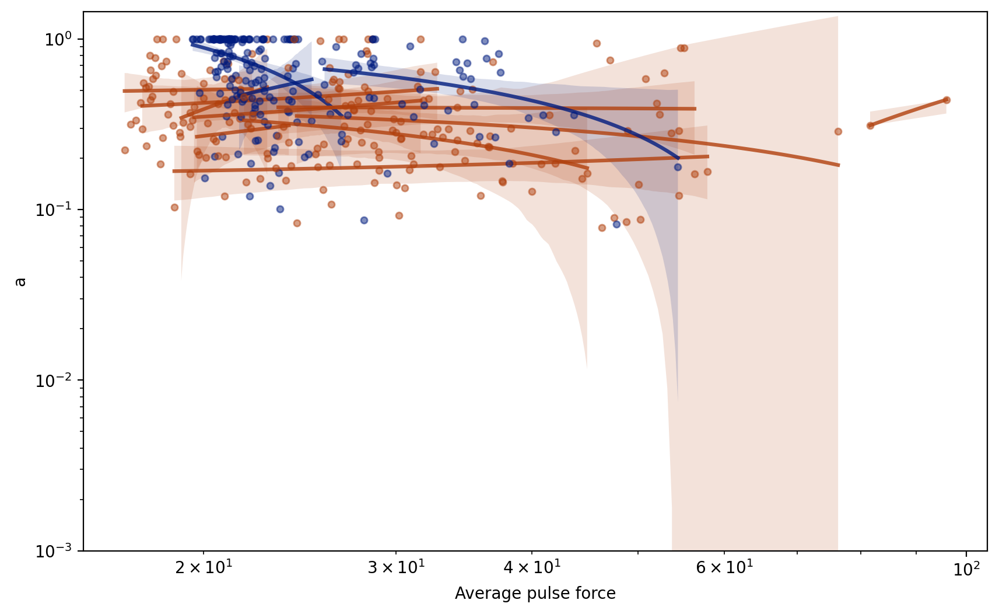

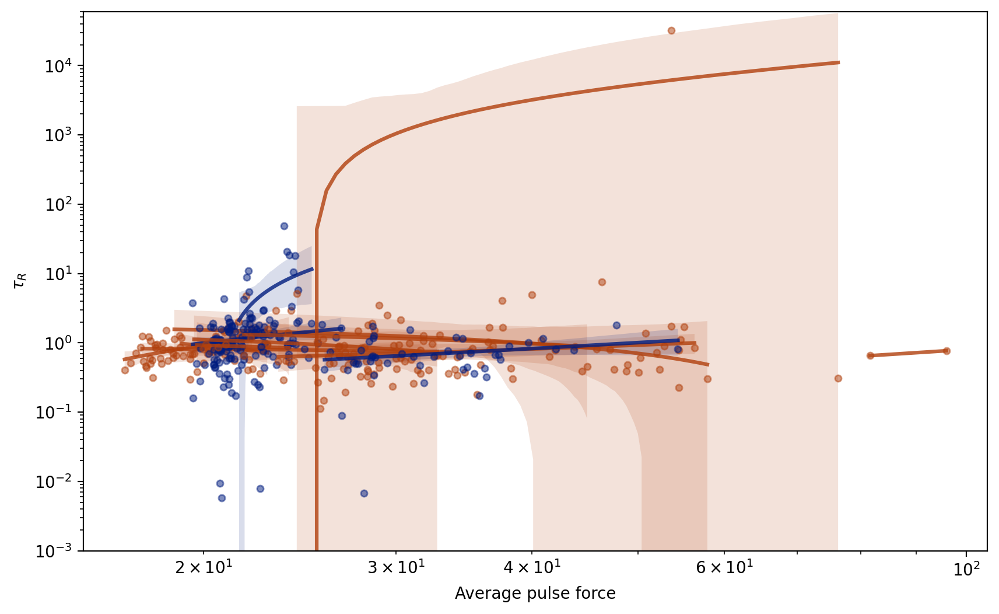

In [40]:
rng = np.random.default_rng()

df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    # plot perturb data
    for (i, embryo) in enumerate(df_results_filtered['EMBRYO'].unique()):
        plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='noco')&(df_results_filtered['EMBRYO']==embryo), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='noco')&(df_results_filtered['EMBRYO']==embryo), param], 'o', color=sns.color_palette()[3], alpha=0.5, markersize = 4, label=embryo)
        plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='taxol')&(df_results_filtered['EMBRYO']==embryo), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='taxol')&(df_results_filtered['EMBRYO']==embryo), param], 'o', color=sns.color_palette()[1], alpha=0.5, markersize = 4, label=embryo)
        
        if len(df_results_filtered[(df_results_filtered['MT_STATUS']=='taxol')&(df_results_filtered['EMBRYO']==embryo)].dropna()) > 0:
            sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='taxol')&(df_results_filtered['EMBRYO']==embryo)], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[1], alpha=0.8))

        if len(df_results_filtered[(df_results_filtered['MT_STATUS']=='noco')&(df_results_filtered['EMBRYO']==embryo)].dropna()) > 0:
            sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='noco')&(df_results_filtered['EMBRYO']==embryo)], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[3], alpha=0.8))
    
    plt.xlabel('Average pulse force')
    plt.ylabel(label)
    # plt.legend()
    plt.ylim(bottom=max(df_results_filtered[param].min(), 0.001))
    # plt.xlim(left=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

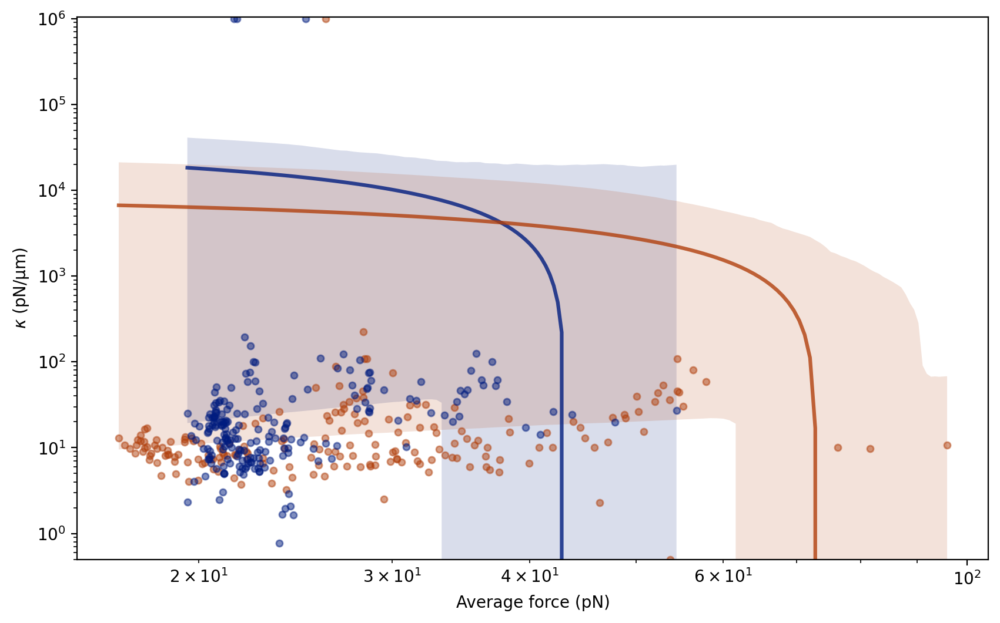

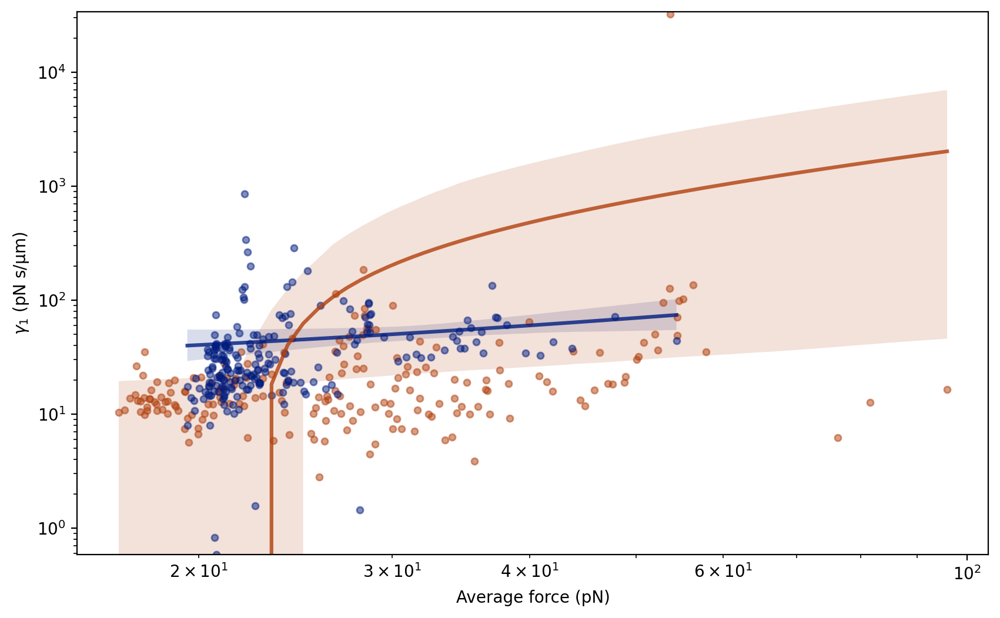

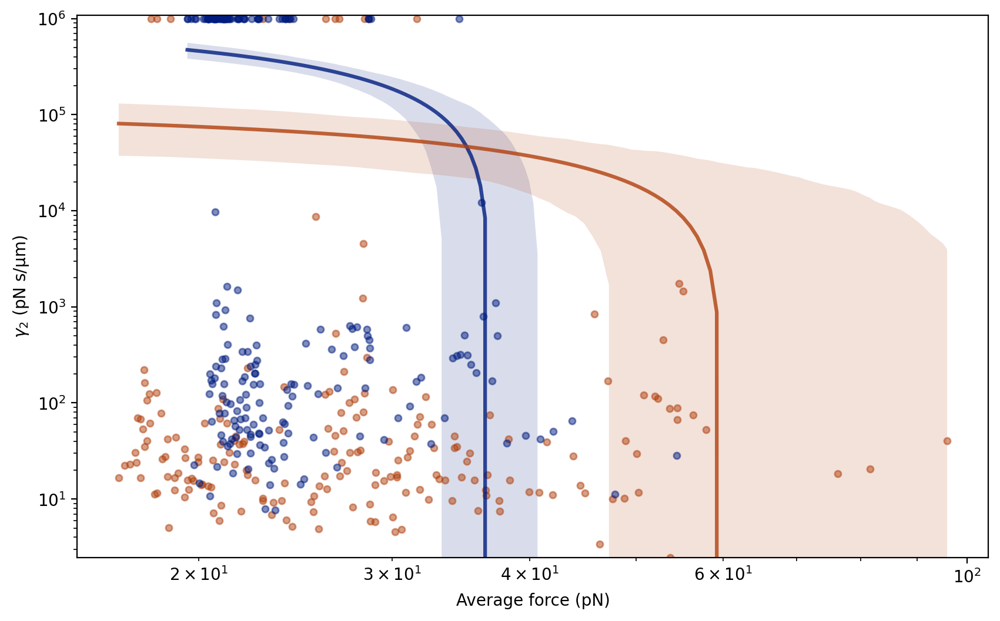

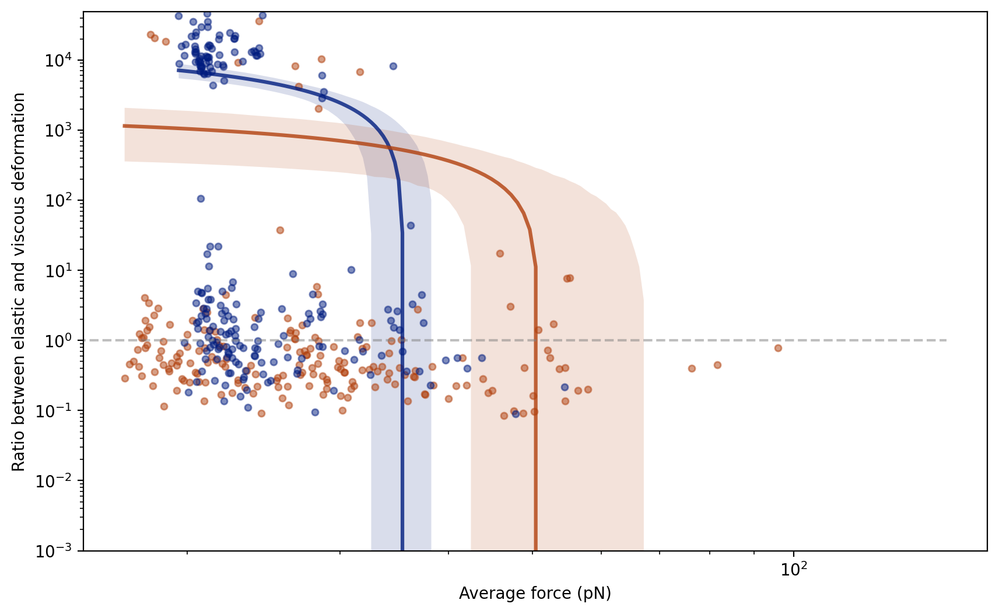

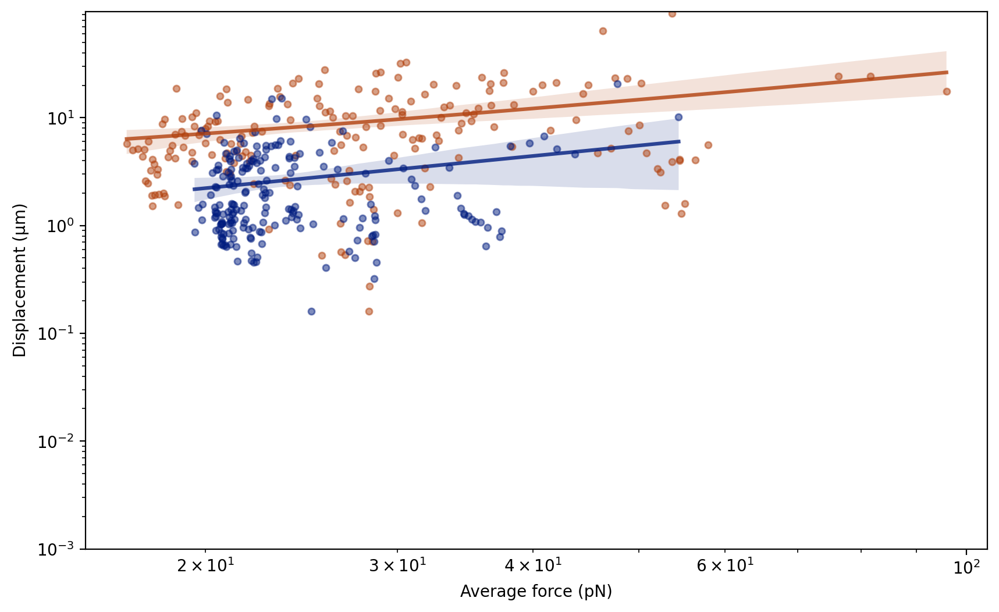

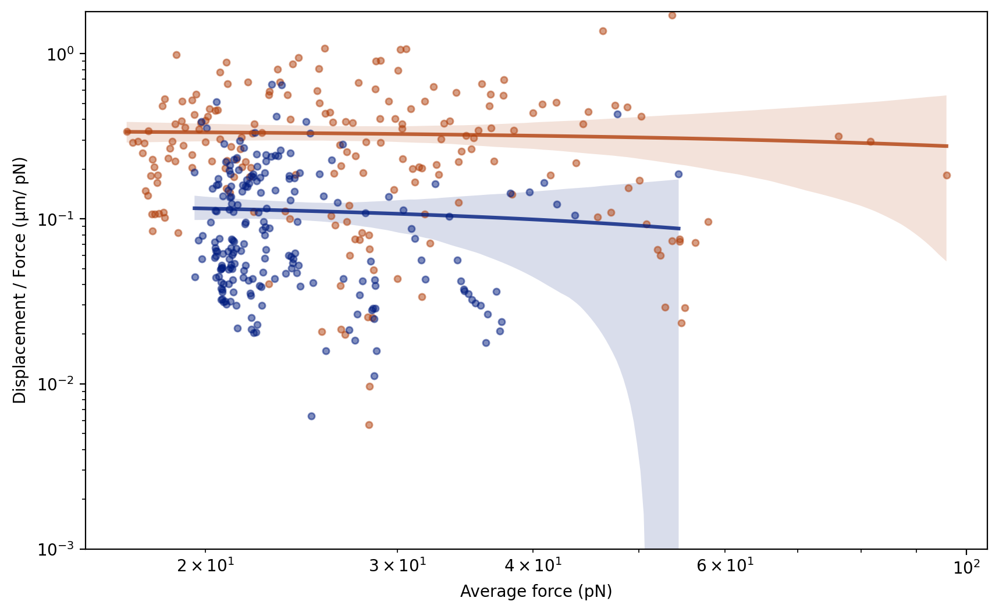

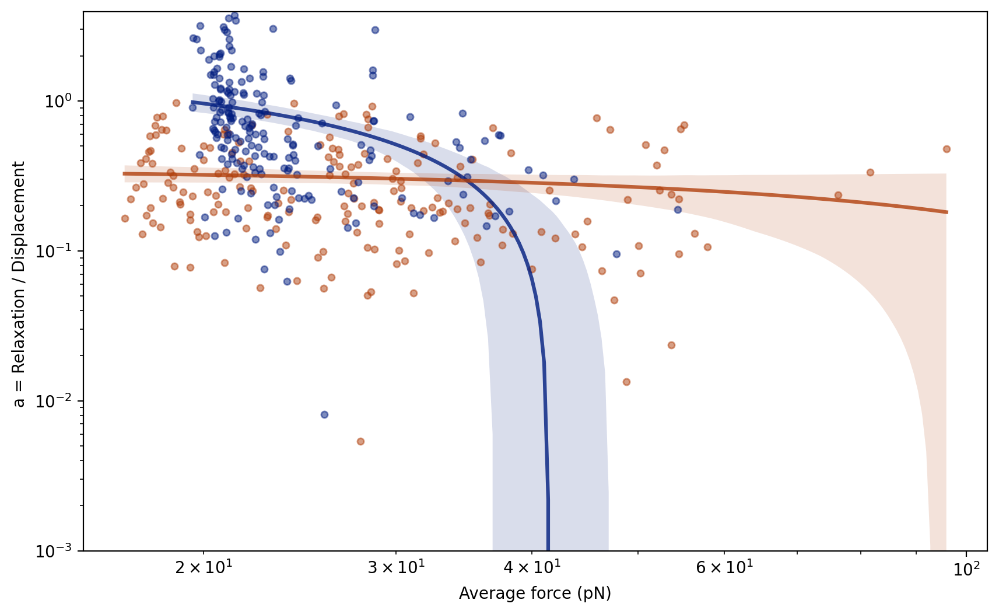

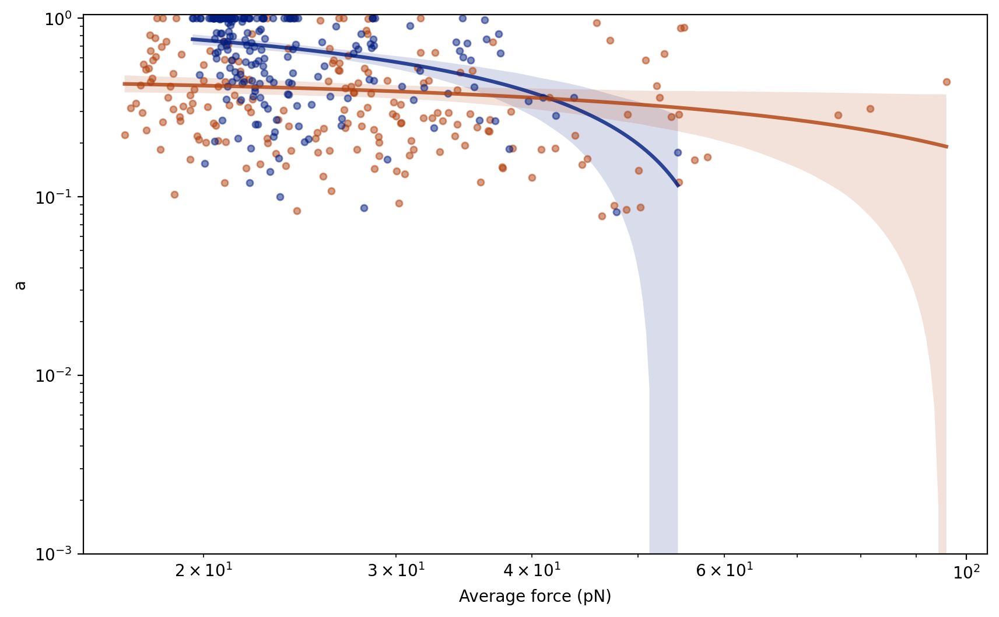

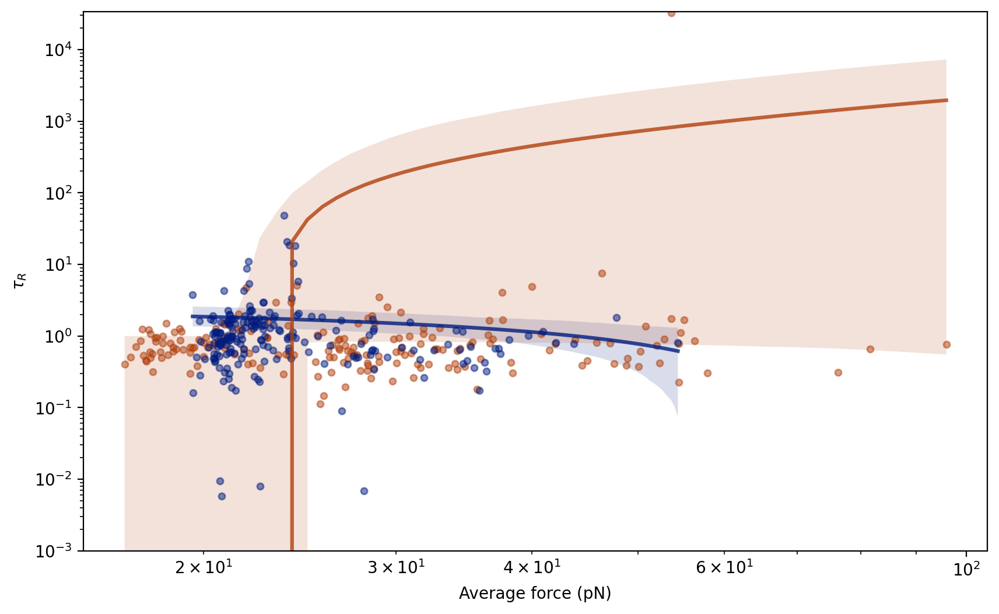

In [41]:
df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    # plot perturb data
    plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='noco'), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='noco'), param], 'o', color=sns.color_palette()[3], alpha=0.5, markersize = 4, label=embryo)
    plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='taxol'), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='taxol'), param], 'o', color=sns.color_palette()[1], alpha=0.5, markersize = 4, label=embryo)
    
    sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='taxol')], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[1], alpha=0.8))

    sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='noco')], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[3], alpha=0.8))

    if param =='elastic_viscous_ratio':
        plt.hlines(1, 0, 150, color='gray', linestyle='--', alpha=0.5)
    
    plt.xlabel('Average force (pN)')
    plt.ylabel(label)
    # plt.legend()
    plt.ylim(bottom=max(df_results_filtered[param].min(), 0.001))
    # plt.xlim(left=0)
    # plt.ylim(bottom=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

# Individual curves averaged and binned by force

In [42]:
folder = '/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_nocodazole/2_analysis/measurements_extended_info/'

df_perturb_tracks = pd.DataFrame()
for file in os.listdir(folder):
    if file.endswith('.h5'):
        # Read the data using pandas
        df = pd.read_hdf(folder+file)
        df['file'] = file
        df['EXPERIMENT'] = file[:18].replace('_', '')
        df['EMBRYO'] = file[:15].replace('_', '')
        df_perturb_tracks = pd.concat([df_perturb_tracks, df])

df_perturb_tracks.dropna(subset=[displacement_column], inplace=True)

print(df_perturb_tracks.columns)

Index(['LABEL', 'ID', 'TRACK_ID', 'QUALITY', 'POSITION_X', 'POSITION_Y',
       'POSITION_Z', 'POSITION_T', 'FRAME', 'RADIUS', 'VISIBILITY',
       'MANUAL_SPOT_COLOR', 'MEAN_INTENSITY_CH1', 'MEDIAN_INTENSITY_CH1',
       'MIN_INTENSITY_CH1', 'MAX_INTENSITY_CH1', 'TOTAL_INTENSITY_CH1',
       'STD_INTENSITY_CH1', 'CONTRAST_CH1', 'SNR_CH1', 'DISTANCE [um]',
       'MAGNET_STATUS', 'PULSE_NUMBER', 'FORCE [pN]', 'MT_STATUS',
       'DISPLACEMENT [um]', 'CORRECTION_k', 'CORRECTION_k_ERR', 'CORRECTION_N',
       'CORRECTION_N_ERR', 'CORRECTED DISPLACEMENT [um]', 'file', 'EXPERIMENT',
       'EMBRYO'],
      dtype='object')


In [43]:
df_perturb_tracks['USABLE'] = np.zeros(len(df_perturb_tracks))
for measurement in df_results_filtered[['EXPERIMENT', 'TRACK_ID', 'PULSE_NUMBER']].values:
    embryo, track, pulse = measurement
    
    df = df_perturb_tracks.loc[(df_perturb_tracks['EXPERIMENT']==embryo)&(df_perturb_tracks['TRACK_ID']==track)&(df_perturb_tracks['PULSE_NUMBER']==pulse)]

    df_perturb_tracks.loc[(df_perturb_tracks['EXPERIMENT']==embryo)&(df_perturb_tracks['TRACK_ID']==track)&(df_perturb_tracks['PULSE_NUMBER']==pulse), 'NORMALIZED_TIME'] = (df['FRAME']-np.min(df['FRAME'])) * dt
    
    df_perturb_tracks.loc[(df_perturb_tracks['EXPERIMENT']==embryo)&(df_perturb_tracks['TRACK_ID']==track)&(df_perturb_tracks['PULSE_NUMBER']==pulse), 'AVG_FORCE'] = df_results_filtered.loc[(df_results_filtered['EXPERIMENT']==embryo)&(df_results_filtered['TRACK_ID']==track)&(df_results_filtered['PULSE_NUMBER']==pulse), 'AVG_FORCE'].values[0]

    df_perturb_tracks.loc[(df_perturb_tracks['EXPERIMENT']==embryo)&(df_perturb_tracks['TRACK_ID']==track)&(df_perturb_tracks['PULSE_NUMBER']==pulse), 'USABLE'] = 1

    if len(df['POSITION_T'])>50:
        plt.plot(df['POSITION_T']-np.min(df['POSITION_T']), df[displacement_column], 'o', color=sns.color_palette()[0], alpha=0.5, markersize = 4)
        plt.show()
        print(embryo, track, pulse) 

print(len(df_perturb_tracks[df_perturb_tracks['USABLE'] == 1])/len(df_perturb_tracks))

0.6073916994850046


# Histograms of binned force data

In [44]:


# for (param, label) in zip(params, labels):
#     fig = plt.figure(figsize=(6, 4), dpi=200)
#     df_binned_force = df_results_filtered[(df_results_filtered['AVG_FORCE']>force_range[0])&(df_results_filtered['AVG_FORCE']<force_range[1])]
#     sns.histplot(df_binned_force, x=param, hue='MT_STATUS', palette=darker_colors)
#     plt.xlabel(label)
#     plt.ylabel('Counts')
#     plt.tight_layout()
#     plt.savefig(f'{dir_plots}/results/auxiliary_plots_statistics/result_histogram_{param}.svg', format='svg')
#     plt.show()

#     fig = plt.figure(figsize=(6, 4), dpi=200)
#     res = ecdf(df_binned_force.loc[df_binned_force['MT_STATUS']=='taxol', param].values)
#     ecdf_data_x = df_binned_force.sort_values(by=param, ascending=True).loc[df_binned_force['MT_STATUS']=='taxol', param]
#     sns.ecdfplot(x=res.cdf.quantiles, color=sns.color_palette()[1])
#     ci = res.cdf.confidence_interval(confidence_level=0.95)
#     plt.fill_between(res.cdf.quantiles, ci.low.probabilities, ci.high.probabilities, color=sns.color_palette()[1], alpha=0.5)

#     res = ecdf(df_binned_force.loc[df_binned_force['MT_STATUS']=='noco', param].values)
#     ecdf_data_x = df_binned_force.sort_values(by=param, ascending=True).loc[df_binned_force['MT_STATUS']=='noco', param]
#     sns.ecdfplot(x=res.cdf.quantiles, color=sns.color_palette()[3])
#     ci = res.cdf.confidence_interval(confidence_level=0.95)
#     plt.fill_between(res.cdf.quantiles, ci.low.probabilities, ci.high.probabilities, color=sns.color_palette()[3], alpha=0.5)

#     plt.ylabel('ECDF (proportion)')
#     plt.xlabel(label)
#     plt.tight_layout()
#     plt.savefig(f'{dir_plots}/results/auxiliary_plots_statistics/result_ecdf_{param}.svg', format='svg')
#     plt.show()

#     res = mannwhitneyu(df_binned_force.loc[df_binned_force['MT_STATUS']=='noco', param].values, 
#                     df_binned_force.loc[df_binned_force['MT_STATUS']=='taxol', param].values)

#     print(res)

# Confidence intervals and p values of parameters

In [ ]:
# df_data_stats = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS']).median(numeric_only=True).reset_index()
# df_data_stats['group_size'] = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS']).size().values

# df_data_stats_from_curves = pd.read_csv('/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_nocodazole/3_plots/results/results_displacement_curve_averaged_force_range20-60pN_no_subtr_bck.csv')

# df_params_stats = pd.DataFrame()
# p_values = dict()


# for param in params:
#     df_binned_force = df_data_stats[(df_data_stats['AVG_FORCE']>force_range[0])&(df_data_stats['AVG_FORCE']<force_range[1])]

#     for mt_status in ['taxol', 'noco']:

#         weights=df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, 'group_size'].values
#         weighted_average, ci = weighted_bootstrap(df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, param].values, weights=weights, rng=rng)
#         weighted_average_from_curves, ci_from_curves = weighted_bootstrap(df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, param].values, weights=weights, rng=rng)

#         new_line = {'parameter': param, 
#                     'weighted_average': weighted_average,
#                     'conf_int_low': ci[0], 
#                     'conf_int_high': ci[1],
#                     'y_err_low': weighted_average - ci[0],
#                     'y_err_high': ci[1] - weighted_average,
#                     'MT_STATUS': mt_status
#                     }
#         df_params_stats = pd.concat([df_params_stats, pd.DataFrame(new_line, index=[0])])

#     res = ttest_ind(df_binned_force.loc[df_binned_force['MT_STATUS']=='noco', param].values, 
#                     df_binned_force.loc[df_binned_force['MT_STATUS']=='taxol', param].values, alternative='two-sided', usevar='unequal')
#     pval = res[1]
    
#     p_values[param] = pval


# df_params_stats.to_csv(f'{dir_plots}/results/results_material_properies_stats.csv', index=False)

FileNotFoundError: [Errno 2] No such file or directory: '/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_nocodazole/3_plots/results/results_displacement_curve_averaged_force_range20-60pN_no_subtr_bck.csv'

In [46]:
df_results_from_average_curves = pd.read_csv(f'{dir_plots}/results/results_parameters_curve_averaged_force_range{force_ranges[0][0]}-{force_ranges[0][1]}pN_{subtr_bck_label}{creep_only_label}.csv')
df_results_from_average_curves['group_size'] = df_results_from_average_curves .groupby(['EMBRYO', 'MT_STATUS']).size().values
df_results_from_average_curves.sort_values(by=['MT_STATUS'], ascending=False, inplace=True)

df_params_avg_curves_stats = pd.DataFrame()

p_values_avg_curves = dict()

for param in params:
    if param in df_results_from_average_curves.columns:

        for mt_status in ['taxol', 'noco']:

            weights=df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']==mt_status, 'group_size'].values

            weighted_average, ci = weighted_bootstrap(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']==mt_status, param].values, weights=weights, rng=rng)

            new_line = {'parameter': param, 
                        'weighted_average': weighted_average,
                        'conf_int_low': ci[0], 
                        'conf_int_high': ci[1],
                        'y_err_low': weighted_average - ci[0],
                        'y_err_high': ci[1] - weighted_average,
                        'MT_STATUS': mt_status
                        }
            df_params_avg_curves_stats = pd.concat([df_params_avg_curves_stats, pd.DataFrame(new_line, index=[0])])

        weights = (df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='taxol', 'COUNT'].values*len(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='taxol', 'COUNT'].values)/np.sum(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='taxol', 'COUNT'].values), 
        df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='noco', 'COUNT'].values*len(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='noco', 'COUNT'].values)/np.sum(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='noco', 'COUNT'].values))

        res  = ttest_ind(
            df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='taxol', param].values, df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='noco', param].values,  weights=weights, alternative='two-sided', usevar='unequal')
    
        pval = res[1]
    
        p_values_avg_curves[param] = pval

df_params_avg_curves_stats.to_csv(f'{dir_plots}/results/results_material_properies_avg_curves_stats_{subtr_bck_label}.csv', index=False)
print('P-values for the parameters from the averaged curves:', p_values_avg_curves)

P-values for the parameters from the averaged curves: {'k': np.float64(0.5198844577263879), 'eta_1': np.float64(0.32763876621140064), 'eta_2': np.float64(0.007658273100768415), 'elastic_viscous_ratio': np.float64(0.2160685702190224), 'rising_dif': np.float64(0.006039604851271144), 'rising_dif_norm': np.float64(0.007626286679522055), 'relative_dif': np.float64(0.25613902866247834), 'a': np.float64(0.18809304873150434), 'tau_r': np.float64(0.294989177638898)}


In [47]:
df_data_stats = df_data_stats.sort_values(by='MT_STATUS', ascending=False)
df_data_stats

,EMBRYO,MT_STATUS,Unnamed: 0,TRACK_ID,PULSE_NUMBER,AVG_FORCE,k,eta_1,eta_2,k_err,...,R_SQUARED_fit,rising_dif,relaxing_dif,rising_dif_norm,rising_dif_norm_inverse,relative_dif,tau_r,a,elastic_viscous_ratio,group_size
10,20250507s04p01,taxol,129.0,2.0,6.0,21.219212,12.242560,21.461292,379.891647,1.285087,...,0.852407,2.365479,-1.918573,0.111540,8.965803,0.762018,0.986200,0.840264,5.271383,134
11,20250507s04p02,taxol,15.5,1.0,5.5,22.563282,41.541777,73.664680,246.169926,20.490549,...,0.612937,0.994234,-0.279741,0.042923,23.301174,0.234545,2.006878,0.395348,0.659390,28
12,20250507s04p03,taxol,223.0,0.0,6.0,31.856203,42.292032,47.763213,308.584807,3.462306,...,0.854738,1.223732,-0.465116,0.039404,25.378348,0.288388,0.630774,0.540003,1.173927,45
0,20240808s03p01,noco,357.5,0.0,1.5,88.755590,10.231960,14.569179,30.293693,1.790832,...,0.792382,20.878872,-8.250749,0.239718,4.410254,0.406199,0.709300,0.376005,0.620037,2
1,20240808s03p02,noco,187.5,0.0,3.5,33.188262,5.768800,10.245721,12.673759,0.733137,...,0.956960,20.133572,-3.887488,0.549147,1.828000,0.215040,0.933052,0.281783,0.392416,12
2,20250507s01p01,noco,310.0,1.0,5.0,18.550811,10.039019,13.701160,40.091424,0.578992,...,0.919766,4.303658,-1.485443,0.206815,4.835236,0.326213,0.685353,0.460559,0.853771,37
3,20250507s01p02,noco,256.0,0.0,4.0,21.535673,7.619646,12.902453,14.657216,0.557724,...,0.950985,8.362097,-2.079817,0.401045,2.493487,0.181525,0.947623,0.219348,0.280980,7
4,20250507s01p03,noco,285.5,1.0,4.5,24.822571,7.438618,17.685040,11.246054,1.344603,...,0.961937,16.111535,-2.683428,0.507065,2.000353,0.172360,1.146617,0.215862,0.275825,12
5,20250507s02p01,noco,331.0,0.0,5.0,26.851989,11.412521,22.545951,35.309220,1.155861,...,0.931439,5.067502,-1.380818,0.209275,4.778411,0.226519,0.695737,0.385356,0.626958,31
6,20250507s02p02,noco,351.5,0.0,5.5,21.086099,8.991793,15.224113,31.177437,0.763747,...,0.940809,5.800899,-1.679562,0.291751,3.434887,0.299058,0.843886,0.379337,0.616829,10


/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_5573/512440979.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


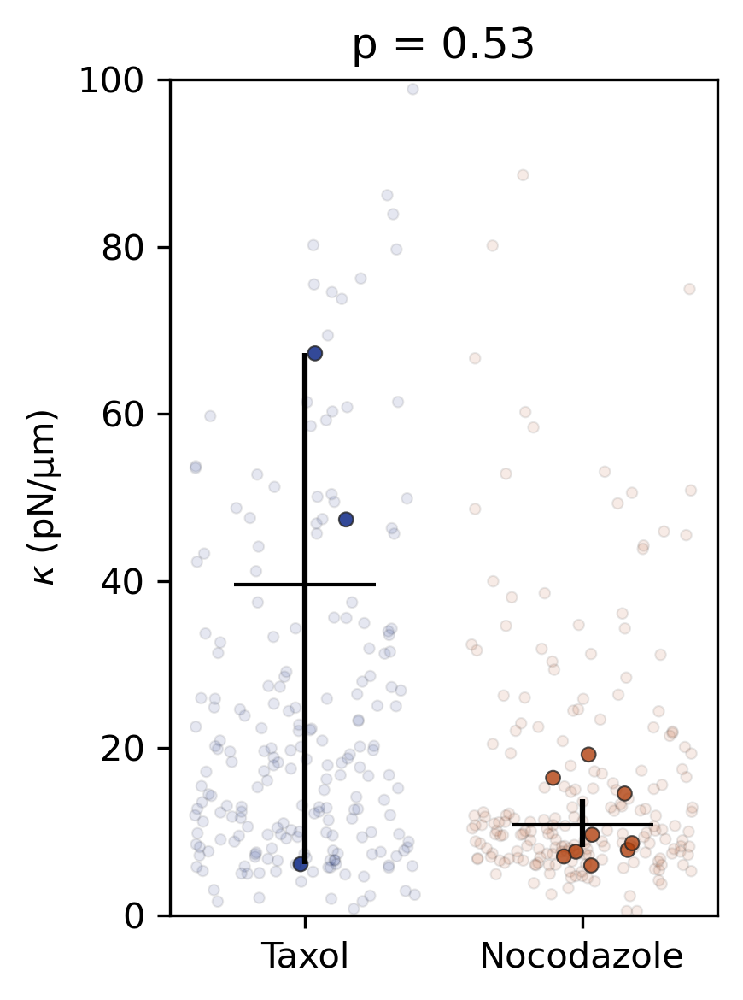

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_5573/512440979.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


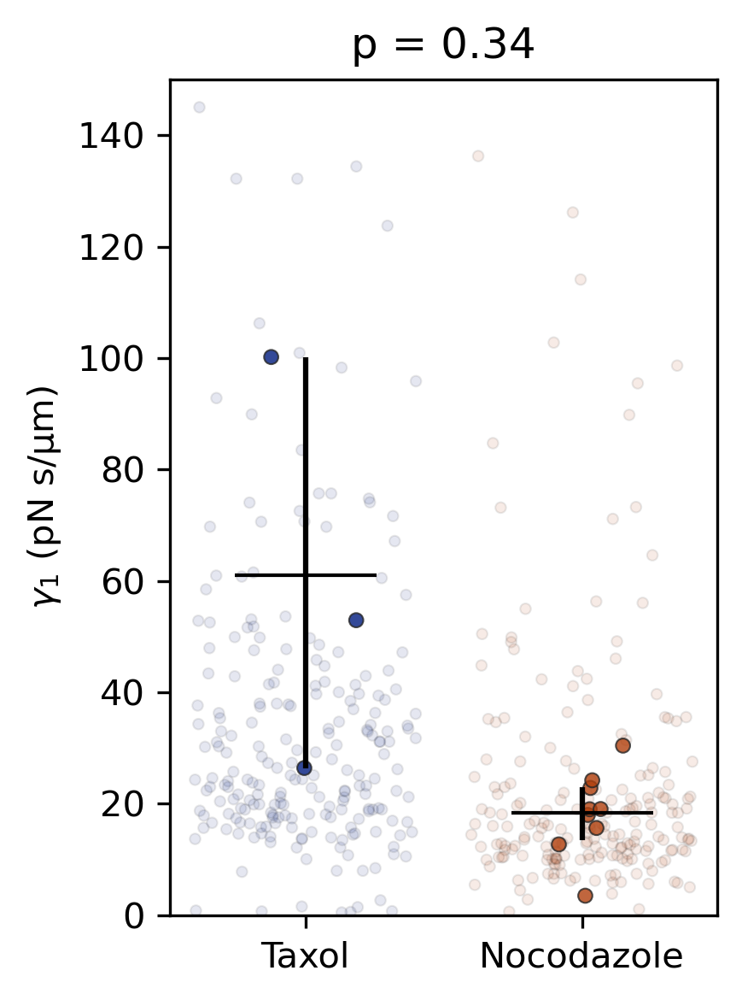

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_5573/512440979.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


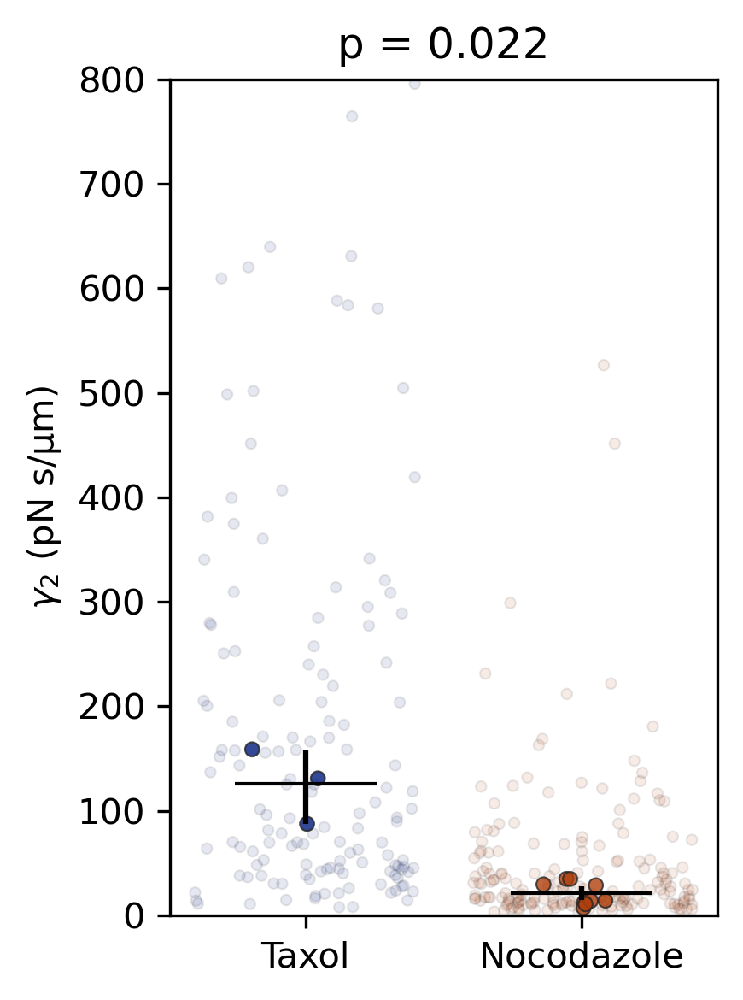

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_5573/512440979.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


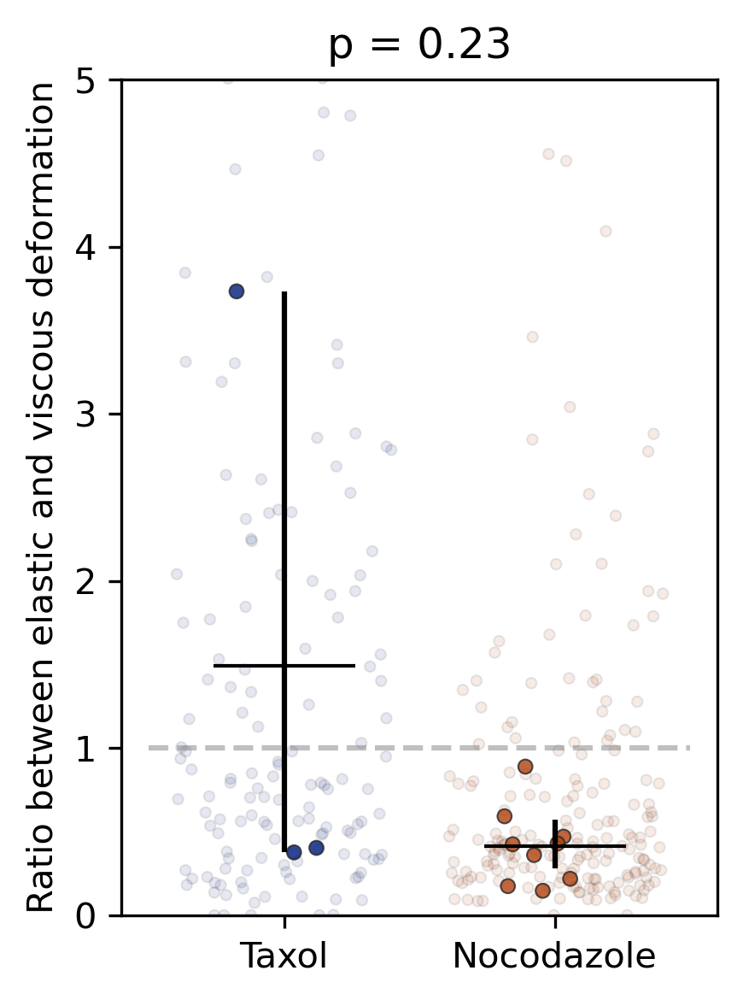

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_5573/512440979.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


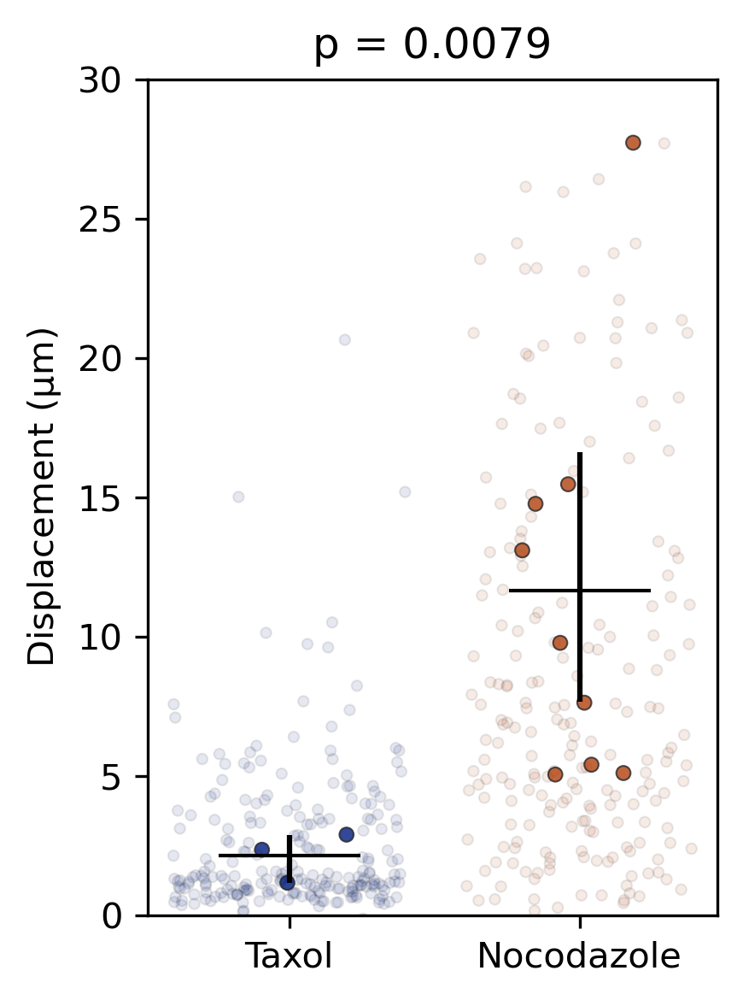

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_5573/512440979.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


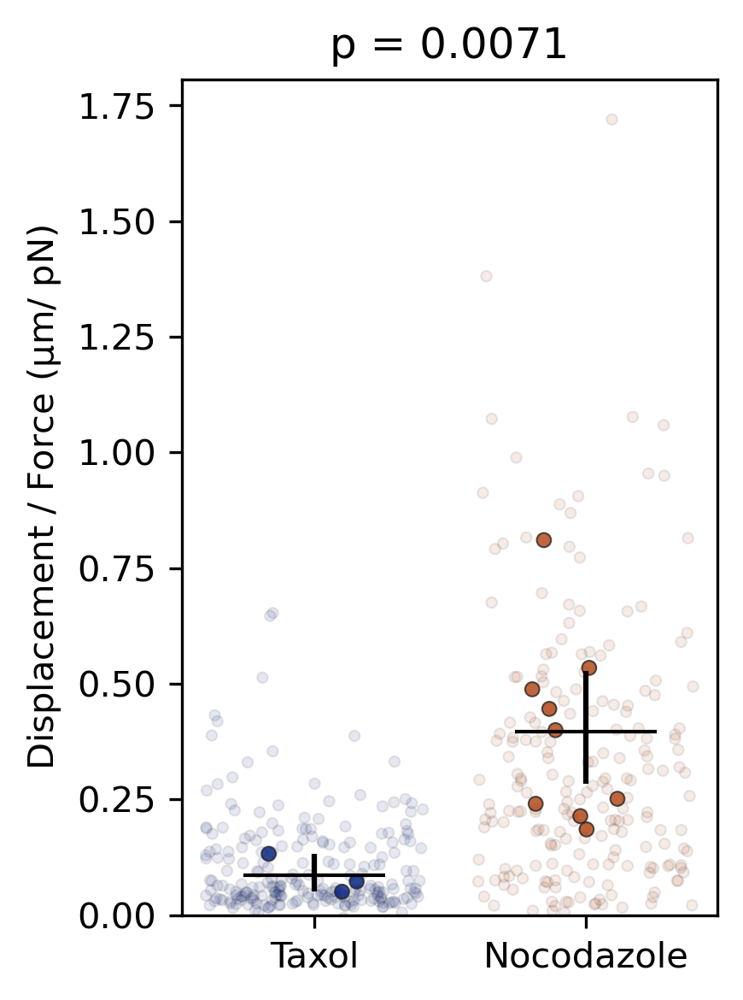

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_5573/512440979.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


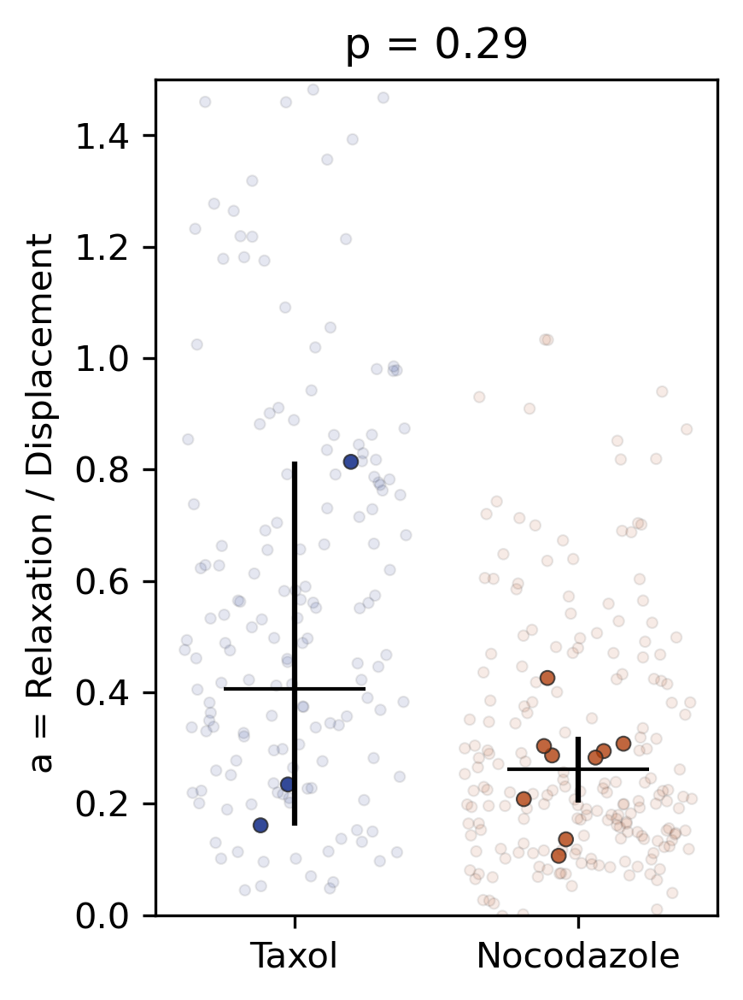

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_5573/512440979.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


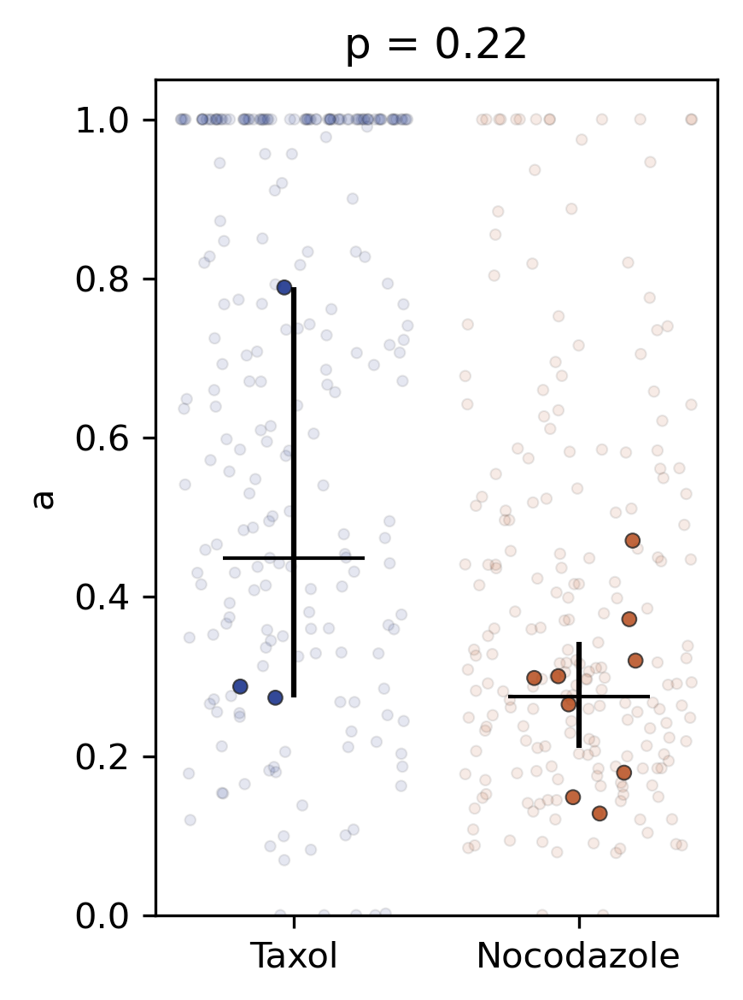

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_5573/512440979.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


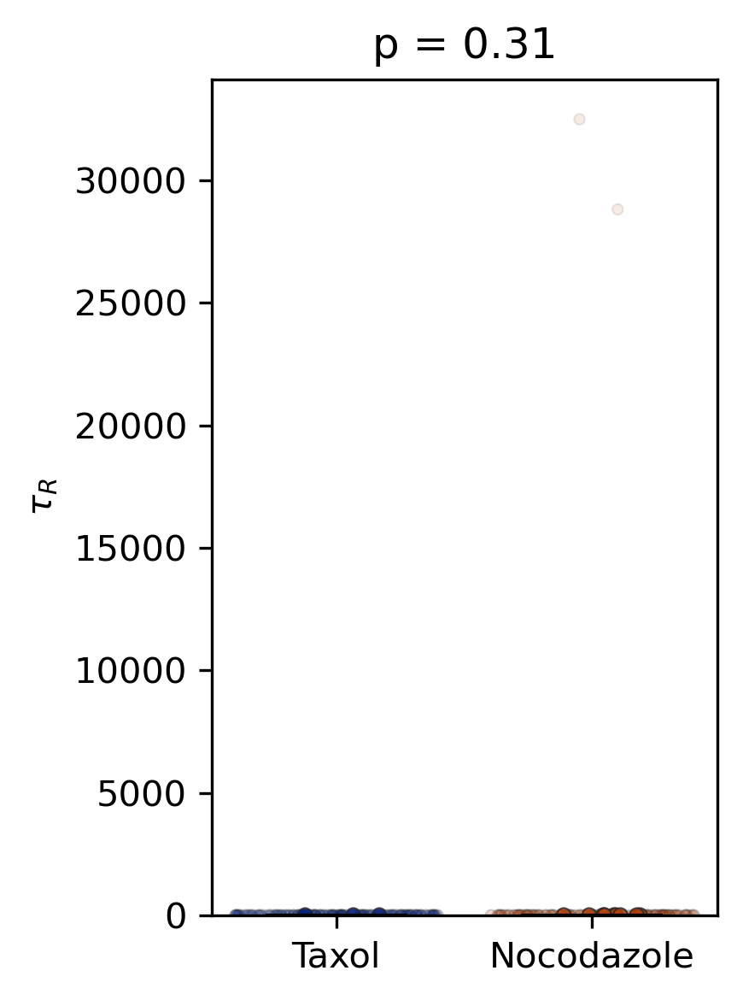

In [ ]:
df_params_stats = df_params_stats.sort_values(by='MT_STATUS', ascending=False)
df_results_filtered = df_results_filtered.sort_values(by='MT_STATUS', ascending=False)

for (param, label) in zip(params, labels):
    p_value = p_values[param]
    fig = plt.figure(figsize=(3, 4), dpi=300)
    sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_filtered, jitter=0.4, alpha=0.1, linewidth=0.5, legend=False, size=3, zorder=0, palette=darker_colors)
    # sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_data_stats, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, zorder=1, palette=darker_colors)

    if param in df_results_from_average_curves.columns:
        p_value_avg_curves = p_values_avg_curves[param]
        sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)
        
        plt.errorbar(df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'MT_STATUS'], 
                 df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'weighted_average'], 
                 yerr=np.array([df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'y_err_low'].values, df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'y_err_high'].values]), 
                 marker = '_', markersize=40,  color='k', linestyle='', zorder=2)



    plt.title(f'p = {p_value_avg_curves:.2g}')
    plt.ylabel(label)
    plt.xlabel('')
    plt.ylim(bottom=0)
    plt.xticks(ticks = ['taxol', 'noco'], labels=['Taxol', 'Nocodazole'])
    if param =='k':
         plt.ylim(bottom=0, top=100)
    elif param =='eta_1':
         plt.ylim(bottom=0, top=150)
    elif param == 'eta_2':
        plt.ylim(bottom=0, top=800)
    elif param == 'elastic_viscous_ratio':
        plt.ylim(bottom=0, top=5)
        plt.hlines(1, -0.5, 1.5, color='gray', linestyle='--', alpha=0.5)
    elif param == 'rising_dif':
        plt.ylim(bottom=0, top=30)
    elif param == 'relative_dif':
        plt.ylim(bottom=0, top=1.5)

    # plt.yscale('log')
    plt.tight_layout()
    plt.savefig(f'{dir_plots}/results/result_{param}.svg', format='svg')
    plt.show()